# Importing Libraries/Modules

In [1]:
import pandas as pd # package for high-performance, easy-to-use data structures and data analysis
import numpy as np # fundamental package for scientific computing with Python
import matplotlib
import matplotlib.pyplot as plt # for plotting
import seaborn as sns # for making plots with seaborn
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
color = sns.color_palette()
import scorecardpy as sc
import pprint
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import math
import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()
from sklearn import preprocessing
import warnings
warnings.filterwarnings("ignore")

#Print all rows and columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Application CSV

In [2]:
application_df = pd.read_csv('IS453 Group Assignment - Application Data.csv')
application_df.head()
application_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


### Selection of Relevant Data

In [3]:
# Select relevant data and store in it inside df
filtered_columns = ['SK_ID_CURR','TARGET','CNT_CHILDREN','AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE','NAME_INCOME_TYPE','NAME_EDUCATION_TYPE','DAYS_BIRTH','DAYS_EMPLOYED','FLAG_MOBIL','FLAG_EMP_PHONE','FLAG_WORK_PHONE','FLAG_CONT_MOBILE','FLAG_PHONE','FLAG_EMAIL','OCCUPATION_TYPE','CNT_FAM_MEMBERS','REGION_RATING_CLIENT_W_CITY','REG_CITY_NOT_LIVE_CITY','ORGANIZATION_TYPE','EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3','FLAG_DOCUMENT_2','FLAG_DOCUMENT_3','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_6','FLAG_DOCUMENT_7','FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_11','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21']
df = application_df[filtered_columns]
df.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,Working,Secondary / secondary special,-9461,-637,1,1,0,1,1,0,Laborers,1.0,2,0,Business Entity Type 3,0.083037,0.262949,0.139376,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,State servant,Higher education,-16765,-1188,1,1,0,1,1,0,Core staff,2.0,1,0,School,0.311267,0.622246,NaN,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,Working,Secondary / secondary special,-19046,-225,1,1,1,1,1,0,Laborers,1.0,2,0,Government,NaN,0.555912,0.729567,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,Working,Secondary / secondary special,-19005,-3039,1,1,0,1,0,0,Laborers,2.0,2,0,Business Entity Type 3,NaN,0.650442,NaN,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,Working,Secondary / secondary special,-19932,-3038,1,1,0,1,0,0,Core staff,1.0,2,0,Religion,NaN,0.322738,NaN,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


# Credit Bureau CSV

In [4]:
bureau_df = pd.read_csv("IS453 Group Assignment - Bureau Data.csv")
bureau_df.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


### Treatments to Credit Bureau for Merging 

In [5]:
# Extract SK_ID_CURR
unique_ids = bureau_df.SK_ID_CURR.unique()
unique_ids

array([215354, 162297, 402440, ..., 448157, 345866, 235871], dtype=int64)

In [6]:
# Create new dataframe for to store credit bureau's treated data
bureau_aggregated = pd.DataFrame(unique_ids, columns = ["SK_ID_CURR"])
bureau_aggregated.head()

,SK_ID_CURR
0,215354
1,162297
2,402440
3,238881
4,222183


In [7]:
# CREDIT_ACTIVE COLUMN

# Group by SK_ID_CURR and CREDIT_ACTIVE, and count the occurrences
credit_counts = bureau_df[bureau_df['CREDIT_ACTIVE'].isin(['Active', 'Closed'])].groupby(['SK_ID_CURR', 'CREDIT_ACTIVE']).size().unstack(fill_value=0)

# Rename the columns for clarity
credit_counts = credit_counts.rename(columns={'Active': 'CREDIT_ACTIVE', 'Closed': 'CREDIT_CLOSED'})

# Merge the counts with bureau_aggregated based on SK_ID_CURR
bureau_aggregated = bureau_aggregated.merge(credit_counts, how='left', left_on='SK_ID_CURR', right_index=True)

# Fill any missing values with 0
bureau_aggregated[['CREDIT_ACTIVE', 'CREDIT_CLOSED']] = bureau_aggregated[['CREDIT_ACTIVE', 'CREDIT_CLOSED']].fillna(0).astype(int)

bureau_aggregated.head()


,SK_ID_CURR,CREDIT_ACTIVE,CREDIT_CLOSED
0,215354,6,5
1,162297,3,3
2,402440,1,0
3,238881,3,5
4,222183,5,3


In [8]:
# to drop other currencies outside of currency 
# bureau_df = bureau_df[bureau_df['CREDIT_CURRENCY'] == 'currency 1']
# bureau_df.head()

# Calculate the currency counts in bureau_df
currency_counts = bureau_df['CREDIT_CURRENCY'].value_counts()

# Group bureau_df by 'SK_ID_CURR' and calculate the sum of currency counts for each ID
currency_counts_by_id = bureau_df.groupby('SK_ID_CURR')['CREDIT_CURRENCY'].value_counts().unstack(fill_value=0).reset_index()

# Rename the currency columns to include '_COUNT' and fill missing currencies with 0
currency_counts_by_id.columns = [f'{col}_COUNT' if col != 'SK_ID_CURR' else col for col in currency_counts_by_id.columns]
currency_counts_by_id = currency_counts_by_id.fillna(0)

# Merge the currency counts into bureau_aggregated based on 'SK_ID_CURR'
bureau_aggregated = bureau_aggregated.merge(currency_counts_by_id, how='left', on='SK_ID_CURR')

bureau_aggregated.head()


,SK_ID_CURR,CREDIT_ACTIVE,CREDIT_CLOSED,currency 1_COUNT,currency 2_COUNT,currency 3_COUNT,currency 4_COUNT
0,215354,6,5,11,0,0,0
1,162297,3,3,6,0,0,0
2,402440,1,0,1,0,0,0
3,238881,3,5,8,0,0,0
4,222183,5,3,8,0,0,0


In [9]:
# Columns to calculate the average for
columns_to_average = [
    'DAYS_CREDIT', 'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT',
    'AMT_CREDIT_MAX_OVERDUE', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_LIMIT',
    'AMT_CREDIT_SUM_OVERDUE', 'DAYS_CREDIT_UPDATE', 'AMT_ANNUITY']

# Calculate the average for each column for each ID
averages = bureau_df.groupby('SK_ID_CURR')[columns_to_average].mean()

# Merge the averages into bureau_aggregated based on SK_ID_CURR
bureau_aggregated = bureau_aggregated.merge(averages, how='left', on='SK_ID_CURR')

# Rename the columns for clarity
column_mapping = {
    col: f"Avg_{col}" for col in columns_to_average}

bureau_aggregated.rename(columns=column_mapping, inplace=True)

bureau_aggregated.head()

,SK_ID_CURR,CREDIT_ACTIVE,CREDIT_CLOSED,currency 1_COUNT,currency 2_COUNT,currency 3_COUNT,currency 4_COUNT,Avg_DAYS_CREDIT,Avg_DAYS_CREDIT_ENDDATE,Avg_DAYS_ENDDATE_FACT,Avg_AMT_CREDIT_MAX_OVERDUE,Avg_AMT_CREDIT_SUM,Avg_AMT_CREDIT_SUM_LIMIT,Avg_AMT_CREDIT_SUM_OVERDUE,Avg_DAYS_CREDIT_UPDATE,Avg_AMT_ANNUITY
0,215354,6,5,11,0,0,0,-727.818182,2685.300000,-889.8,25891.500,5.430859e+05,36327.540,0.0,-367.272727,NaN
1,162297,3,3,6,0,0,0,-1344.500000,245.500000,-1125.0,2997.000,1.371731e+06,0.000,0.0,-777.833333,NaN
2,402440,1,0,1,0,0,0,-96.000000,269.000000,NaN,0.000,8.991000e+04,0.000,0.0,-22.000000,NaN
3,238881,3,5,8,0,0,0,-914.750000,-521.166667,-847.2,0.000,1.606549e+05,57080.025,0.0,-530.625000,NaN
4,222183,5,3,8,0,0,0,-959.125000,327.625000,-1099.0,21924.954,8.948700e+05,82.332,0.0,-618.875000,NaN


# Merge Application and Bureau Dataset

In [10]:
combined_df = pd.merge(df, bureau_aggregated, on="SK_ID_CURR", how="right")
combined_df.head()
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 305811 entries, 0 to 305810
Data columns (total 60 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   305811 non-null  int64  
 1   TARGET                       263491 non-null  float64
 2   CNT_CHILDREN                 263491 non-null  float64
 3   AMT_INCOME_TOTAL             263491 non-null  float64
 4   AMT_CREDIT                   263491 non-null  float64
 5   AMT_ANNUITY                  263480 non-null  float64
 6   AMT_GOODS_PRICE              263262 non-null  float64
 7   NAME_INCOME_TYPE             263491 non-null  object 
 8   NAME_EDUCATION_TYPE          263491 non-null  object 
 9   DAYS_BIRTH                   263491 non-null  float64
 10  DAYS_EMPLOYED                263491 non-null  float64
 11  FLAG_MOBIL                   263491 non-null  float64
 12  FLAG_EMP_PHONE               263491 non-null  float64
 13 

# Managing Errors

In [11]:
## There was error when runing the filtering code (ValueError: cannot convert float NaN to integer) 
#Check where the NaN columns

# Age information into a separate dataframe
age_data = abs(combined_df[['TARGET', 'DAYS_BIRTH']])
age_data['YEARS_BIRTH'] = age_data['DAYS_BIRTH'] / 365

age_data.isna().sum()
# Create a boolean mask for rows with missing values
rows_with_na = age_data[age_data.isna().any(axis=1)]

# Display the rows with missing values
print(rows_with_na)

        TARGET  DAYS_BIRTH  YEARS_BIRTH
682        NaN         NaN          NaN
683        NaN         NaN          NaN
684        NaN         NaN          NaN
685        NaN         NaN          NaN
686        NaN         NaN          NaN
687        NaN         NaN          NaN
688        NaN         NaN          NaN
689        NaN         NaN          NaN
690        NaN         NaN          NaN
691        NaN         NaN          NaN
692        NaN         NaN          NaN
693        NaN         NaN          NaN
694        NaN         NaN          NaN
695        NaN         NaN          NaN
696        NaN         NaN          NaN
697        NaN         NaN          NaN
698        NaN         NaN          NaN
699        NaN         NaN          NaN
700        NaN         NaN          NaN
701        NaN         NaN          NaN
702        NaN         NaN          NaN
703        NaN         NaN          NaN
704        NaN         NaN          NaN
705        NaN         NaN          NaN


In [12]:
# There are NaN values in the Target Column, proceed to remove those rows
combined_df['TARGET'].isna().sum()

#dropping those rows where target is NA
combined_df.dropna(subset=['TARGET'], inplace=True)
combined_df['TARGET'].isna().sum()


0

# Filter Code to our Target Audience

In [13]:
combined_df['YEARS_BIRTH'] = abs(combined_df['DAYS_BIRTH'])/365
combined_df['YEARS_BIRTH'] = combined_df['YEARS_BIRTH'].apply(math.floor)
combined_df = combined_df.drop(columns = ['DAYS_BIRTH'])
combined_df.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,CREDIT_ACTIVE,CREDIT_CLOSED,currency 1_COUNT,currency 2_COUNT,currency 3_COUNT,currency 4_COUNT,Avg_DAYS_CREDIT,Avg_DAYS_CREDIT_ENDDATE,Avg_DAYS_ENDDATE_FACT,Avg_AMT_CREDIT_MAX_OVERDUE,Avg_AMT_CREDIT_SUM,Avg_AMT_CREDIT_SUM_LIMIT,Avg_AMT_CREDIT_SUM_OVERDUE,Avg_DAYS_CREDIT_UPDATE,Avg_AMT_ANNUITY,YEARS_BIRTH
0,215354,0.0,0.0,270000.0,720000.0,21181.5,720000.0,Working,Higher education,-939.0,1.0,1.0,0.0,1.0,0.0,0.0,Accountants,2.0,2.0,0.0,Trade: type 7,0.873736,0.522745,0.231439,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6,5,11,0,0,0,-727.818182,2685.300000,-889.8,25891.500,5.430859e+05,36327.540,0.0,-367.272727,NaN,48
1,162297,0.0,0.0,171000.0,518562.0,21969.0,463500.0,State servant,Higher education,-3252.0,1.0,1.0,0.0,1.0,0.0,0.0,Core staff,1.0,2.0,1.0,Police,NaN,0.413917,0.802745,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,3,6,0,0,0,-1344.500000,245.500000,-1125.0,2997.000,1.371731e+06,0.000,0.0,-777.833333,NaN,29
2,402440,0.0,0.0,67500.0,327024.0,12456.0,270000.0,Pensioner,Secondary / secondary special,365243.0,1.0,0.0,0.0,1.0,1.0,0.0,NaN,2.0,2.0,0.0,XNA,NaN,0.598858,0.394495,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,1,0,0,0,-96.000000,269.000000,NaN,0.000,8.991000e+04,0.000,0.0,-22.000000,NaN,64
3,238881,0.0,0.0,166500.0,558000.0,23584.5,558000.0,Pensioner,Secondary / secondary special,365243.0,1.0,0.0,0.0,1.0,0.0,0.0,NaN,2.0,2.0,0.0,XNA,0.861678,0.698909,0.363945,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,5,8,0,0,0,-914.750000,-521.166667,-847.2,0.000,1.606549e+05,57080.025,0.0,-530.625000,NaN,56
4,222183,0.0,0.0,315000.0,592560.0,32143.5,450000.0,Working,Incomplete higher,-544.0,1.0,1.0,0.0,1.0,0.0,1.0,Core staff,2.0,2.0,0.0,Military,NaN,0.564935,0.380800,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,3,8,0,0,0,-959.125000,327.625000,-1099.0,21924.954,8.948700e+05,82.332,0.0,-618.875000,NaN,29


In [30]:
# Filter 30 and below
target_df = combined_df[combined_df['YEARS_BIRTH']<=30]
target_df = target_df.reset_index(drop=True)
target_df.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,CREDIT_ACTIVE,CREDIT_CLOSED,currency 1_COUNT,currency 2_COUNT,currency 3_COUNT,currency 4_COUNT,Avg_DAYS_CREDIT,Avg_DAYS_CREDIT_ENDDATE,Avg_DAYS_ENDDATE_FACT,Avg_AMT_CREDIT_MAX_OVERDUE,Avg_AMT_CREDIT_SUM,Avg_AMT_CREDIT_SUM_LIMIT,Avg_AMT_CREDIT_SUM_OVERDUE,Avg_DAYS_CREDIT_UPDATE,Avg_AMT_ANNUITY,YEARS_BIRTH
0,162297,0.00,0.00,171000.00,518562.00,21969.00,463500.00,State servant,Higher education,-3252.00,1.00,1.00,0.00,1.00,0.00,0.00,Core staff,1.00,2.00,1.00,Police,NaN,0.41,0.80,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3,3,6,0,0,0,-1344.50,245.50,-1125.00,2997.00,1371731.03,0.00,0.00,-777.83,NaN,29
1,222183,0.00,0.00,315000.00,592560.00,32143.50,450000.00,Working,Incomplete higher,-544.00,1.00,1.00,0.00,1.00,0.00,1.00,Core staff,2.00,2.00,0.00,Military,NaN,0.56,0.38,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5,3,8,0,0,0,-959.12,327.62,-1099.00,21924.95,894870.00,82.33,0.00,-618.88,NaN,29
2,234931,0.00,0.00,150039.00,1350000.00,35613.00,1350000.00,Commercial associate,Secondary / secondary special,-240.00,1.00,1.00,1.00,1.00,0.00,0.00,NaN,2.00,2.00,0.00,Industry: type 3,0.63,0.53,0.15,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1,6,7,0,0,0,-1427.43,-841.57,-564.00,15455.63,243305.36,0.00,0.00,-465.14,NaN,29
3,338464,1.00,0.00,135000.00,284400.00,13833.00,225000.00,Working,Higher education,-3040.00,1.00,1.00,1.00,1.00,0.00,0.00,Laborers,2.00,2.00,0.00,Business Entity Type 3,0.27,0.54,0.41,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3,6,9,0,0,0,-1607.11,-1025.62,-1464.67,831.63,114134.60,853.99,0.00,-674.78,NaN,30
4,286014,0.00,0.00,135000.00,269550.00,24853.50,225000.00,Commercial associate,Secondary / secondary special,-633.00,1.00,1.00,0.00,1.00,1.00,1.00,Drivers,2.00,2.00,0.00,Business Entity Type 3,NaN,0.26,0.15,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1,0,1,0,0,0,-137.00,27460.00,NaN,0.00,22500.00,76.59,0.00,-31.00,NaN,24


# EDA

### Boxplot

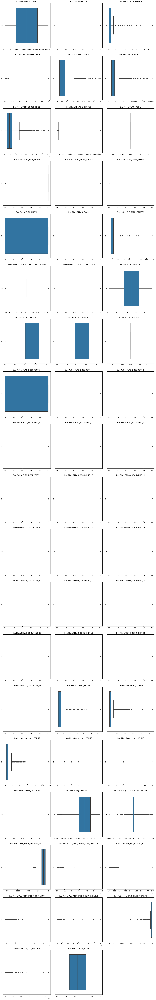

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming numerical_columns is a DataFrame containing only numerical columns from target_df
numerical_columns = combined_df.select_dtypes(include=['number'])

# Calculate the number of rows and columns for subplots
n_cols = 3  # Number of columns
n_rows = (len(numerical_columns.columns) + n_cols - 1) // n_cols  # Number of rows

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.ravel()  # Flatten the 2D array of subplots

# Iterate through the numerical columns
for i, column in enumerate(numerical_columns.columns):
    ax = axes[i]  # Get the current subplot
    sns.boxplot(data=numerical_columns[column], orient='h', ax=ax)
    ax.set_title(f"Box Plot of {column}")

# Remove any empty subplots
for i in range(len(numerical_columns.columns), n_rows * n_cols):
    fig.delaxes(axes[i])

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

### KDEplot

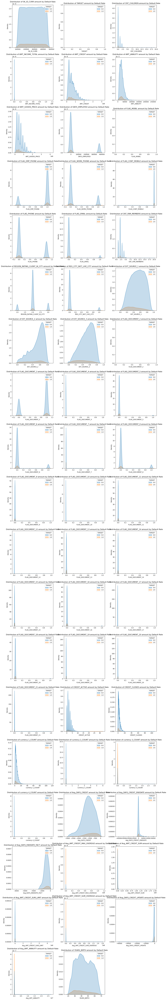

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming num_var is a list of numerical columns from your DataFrame
num_var = combined_df.select_dtypes(include=['number']).columns.tolist()

# Calculate the number of rows and columns for subplots
n_cols = 3  # Number of columns
n_rows = (len(num_var) + n_cols - 1) // n_cols  # Number of rows

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.ravel()  # Flatten the 2D array of subplots

# Iterate through the numerical columns
for i, a in enumerate(num_var):
    ax = axes[i]  # Get the current subplot
    sns.kdeplot(data=combined_df, x=a, hue="TARGET", fill=True, ax=ax)
    ax.set_title('Distribution of ' + a + ' amount by Default Rate')

# Remove any empty subplots
for i in range(len(num_var), n_rows * n_cols):
    fig.delaxes(axes[i])

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

### Outliers

In [31]:
#From Box plot can see that days employed has outlier, run max values to show all the max values in the data frame

pd.options.display.float_format = '{:.2f}'.format
numeric_columns = target_df.select_dtypes(include=['number'])
max_values = numeric_columns.max()
max_values

SK_ID_CURR                       456235.00
TARGET                                1.00
CNT_CHILDREN                         19.00
AMT_INCOME_TOTAL                4500000.00
AMT_CREDIT                      3600000.00
AMT_ANNUITY                      225000.00
AMT_GOODS_PRICE                 3600000.00
DAYS_EMPLOYED                    365243.00
FLAG_MOBIL                            1.00
FLAG_EMP_PHONE                        1.00
FLAG_WORK_PHONE                       1.00
FLAG_CONT_MOBILE                      1.00
FLAG_PHONE                            1.00
FLAG_EMAIL                            1.00
CNT_FAM_MEMBERS                      20.00
REGION_RATING_CLIENT_W_CITY           3.00
REG_CITY_NOT_LIVE_CITY                1.00
EXT_SOURCE_1                          0.91
EXT_SOURCE_2                          0.85
EXT_SOURCE_3                          0.88
FLAG_DOCUMENT_2                       0.00
FLAG_DOCUMENT_3                       1.00
FLAG_DOCUMENT_4                       1.00
FLAG_DOCUME

In [32]:
#convert days employed to all positive
target_df['DAYS_EMPLOYED'] = abs(target_df['DAYS_EMPLOYED'])

target_df['DAYS_EMPLOYED'].describe()

#assuming earliest they could start is 16 years old
days_employed_max = 14 * 365 

target_df[target_df['DAYS_EMPLOYED'] > days_employed_max]['DAYS_EMPLOYED']

134     365243.00
341     365243.00
415     365243.00
625     365243.00
715     365243.00
1640    365243.00
2082    365243.00
2465    365243.00
2502    365243.00
3261    365243.00
3997    365243.00
4129    365243.00
4168    365243.00
4542    365243.00
4584    365243.00
4693    365243.00
5641    365243.00
6044    365243.00
6194    365243.00
7330    365243.00
7595    365243.00
8279    365243.00
8432    365243.00
8551    365243.00
8696    365243.00
9734    365243.00
9747    365243.00
10065   365243.00
10797   365243.00
10818   365243.00
10882   365243.00
11177   365243.00
11677   365243.00
12030   365243.00
12321   365243.00
12733   365243.00
12941   365243.00
13463   365243.00
13802   365243.00
13931   365243.00
14217   365243.00
14509   365243.00
15982   365243.00
16372   365243.00
16388   365243.00
16581   365243.00
16860   365243.00
16919   365243.00
17387   365243.00
18003   365243.00
18220   365243.00
18275   365243.00
18318   365243.00
18436   365243.00
19157   365243.00
19276   36

##### Drop the rows with DAYS_EMPLOYED value 365243

In [33]:
print(target_df.shape[0])
target_df.drop(target_df[target_df['DAYS_EMPLOYED'] > days_employed_max].index,inplace=True)
print(target_df.shape[0])

42637
42524


### Calculate % of NAs for each variables 

In [34]:
total = target_df.isnull().sum().sort_values(ascending = False)
percent = (target_df.isnull().sum()/target_df.isnull().count()*100).sort_values(ascending = False)
missing_df  = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_df

,Total,Percent
Avg_AMT_ANNUITY,29316,68.94
EXT_SOURCE_1,17482,41.11
Avg_AMT_CREDIT_MAX_OVERDUE,13033,30.65
Avg_DAYS_ENDDATE_FACT,8873,20.87
OCCUPATION_TYPE,7132,16.77
Avg_AMT_CREDIT_SUM_LIMIT,3921,9.22
EXT_SOURCE_3,3537,8.32
Avg_DAYS_CREDIT_ENDDATE,734,1.73
EXT_SOURCE_2,80,0.19
AMT_GOODS_PRICE,65,0.15


### Removing Columns with more than 50% missing values

In [35]:
# Define a threshold (50% missing)
threshold = 48

# Get the columns with missing values exceeding the threshold
columns_to_drop = missing_df[missing_df['Percent'] > threshold].index

# Drop the selected columns from the original target_df
target_df = target_df.drop(columns=columns_to_drop)

In [36]:
total = target_df.isnull().sum().sort_values(ascending = False)
percent = (target_df.isnull().sum()/target_df.isnull().count()*100).sort_values(ascending = False)
missing_df  = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_df.head()

,Total,Percent
EXT_SOURCE_1,17482,41.11
Avg_AMT_CREDIT_MAX_OVERDUE,13033,30.65
Avg_DAYS_ENDDATE_FACT,8873,20.87
OCCUPATION_TYPE,7132,16.77
Avg_AMT_CREDIT_SUM_LIMIT,3921,9.22


In [37]:
# Check if there are any rows with more than 10 missing values
rows_w_gt_10_na = target_df[target_df.isnull().sum(axis=1) > 10].shape[0]
print('Percent of total rows missing more than 10 values: ' + str("{:.1%}".format(rows_w_gt_10_na/target_df.shape[0])))



Percent of total rows missing more than 10 values: 0.0%


# Features Selection & Extraction

### Features Extraction 1

In [38]:
# Create a new variable 'SUM_PHONE_FLAGS' by summing the specified columns
target_df['SUM_PHONE_FLAGS'] = target_df[['FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL']].sum(axis=1)

# List of columns to sum for 'SUM_DOCUMENT_FLAGS'
document_columns = ['FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21']

# Create a new variable 'SUM_DOCUMENT_FLAGS' by summing the specified columns
target_df['SUM_DOCUMENT_FLAGS'] = target_df[document_columns].sum(axis=1)
target_df.head()

# List of original columns used to create 'SUM_PHONE_FLAGS'
phone_flags_columns = ['FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL']

# Drop the original columns used to create 'SUM_PHONE_FLAGS'
target_df = target_df.drop(phone_flags_columns, axis=1)

# List of original columns used to create 'SUM_DOCUMENT_FLAGS'
document_columns = ['FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21']

# Drop the original columns used to create 'SUM_DOCUMENT_FLAGS'
target_df = target_df.drop(document_columns, axis=1)
target_df.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,DAYS_EMPLOYED,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,CREDIT_ACTIVE,CREDIT_CLOSED,currency 1_COUNT,currency 2_COUNT,currency 3_COUNT,currency 4_COUNT,Avg_DAYS_CREDIT,Avg_DAYS_CREDIT_ENDDATE,Avg_DAYS_ENDDATE_FACT,Avg_AMT_CREDIT_MAX_OVERDUE,Avg_AMT_CREDIT_SUM,Avg_AMT_CREDIT_SUM_LIMIT,Avg_AMT_CREDIT_SUM_OVERDUE,Avg_DAYS_CREDIT_UPDATE,YEARS_BIRTH,SUM_PHONE_FLAGS,SUM_DOCUMENT_FLAGS
0,162297,0.00,0.00,171000.00,518562.00,21969.00,463500.00,State servant,Higher education,3252.00,Core staff,1.00,2.00,1.00,Police,NaN,0.41,0.80,3,3,6,0,0,0,-1344.50,245.50,-1125.00,2997.00,1371731.03,0.00,0.00,-777.83,29,3.00,1.00
1,222183,0.00,0.00,315000.00,592560.00,32143.50,450000.00,Working,Incomplete higher,544.00,Core staff,2.00,2.00,0.00,Military,NaN,0.56,0.38,5,3,8,0,0,0,-959.12,327.62,-1099.00,21924.95,894870.00,82.33,0.00,-618.88,29,4.00,1.00
2,234931,0.00,0.00,150039.00,1350000.00,35613.00,1350000.00,Commercial associate,Secondary / secondary special,240.00,NaN,2.00,2.00,0.00,Industry: type 3,0.63,0.53,0.15,1,6,7,0,0,0,-1427.43,-841.57,-564.00,15455.63,243305.36,0.00,0.00,-465.14,29,4.00,1.00
3,338464,1.00,0.00,135000.00,284400.00,13833.00,225000.00,Working,Higher education,3040.00,Laborers,2.00,2.00,0.00,Business Entity Type 3,0.27,0.54,0.41,3,6,9,0,0,0,-1607.11,-1025.62,-1464.67,831.63,114134.60,853.99,0.00,-674.78,30,4.00,1.00
4,286014,0.00,0.00,135000.00,269550.00,24853.50,225000.00,Commercial associate,Secondary / secondary special,633.00,Drivers,2.00,2.00,0.00,Business Entity Type 3,NaN,0.26,0.15,1,0,1,0,0,0,-137.00,27460.00,NaN,0.00,22500.00,76.59,0.00,-31.00,24,5.00,1.00


### Correlation Matrix for Feature Selection 

In [39]:
# Filter the DataFrame to keep only the numerical columns
numerical_test_df = target_df.select_dtypes(include=['number'])

# Calculate the correlation for the numerical columns
correlation_matrix = numerical_test_df.corr()

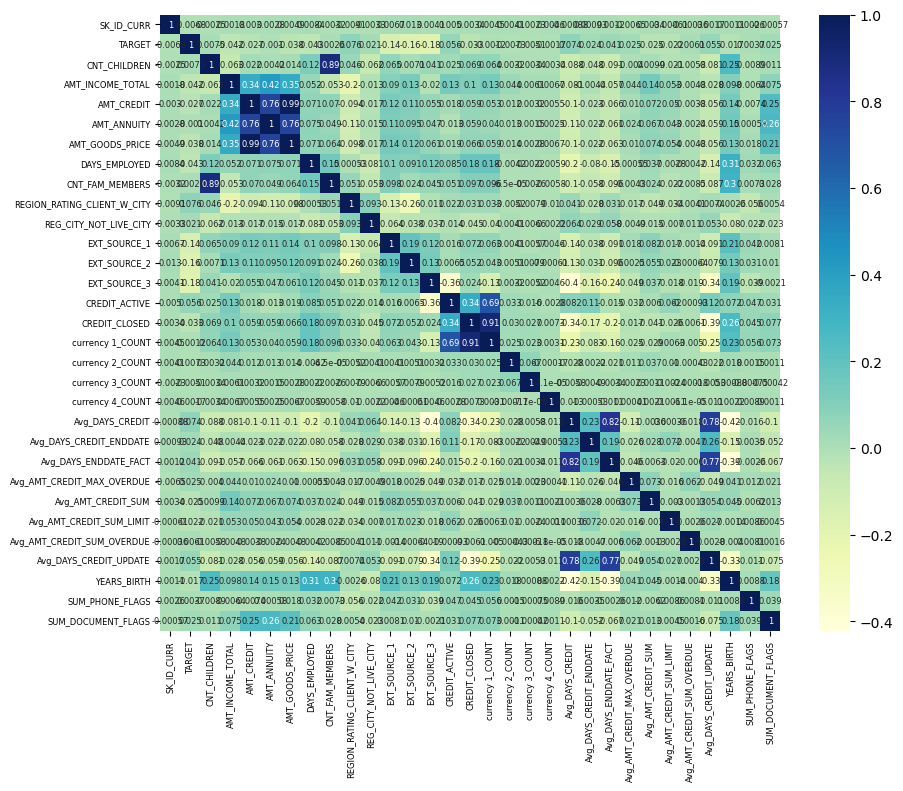

In [40]:
# Create a heatmap with smaller font size for annotations
# Adjust font size for x-axis and y-axis labels
fig, ax = plt.subplots(figsize=(10, 8))

# Create the heatmap
heatmap = sns.heatmap(correlation_matrix, cmap="YlGnBu", annot=True, ax=ax,annot_kws={"size": 6})

# Adjust the font size of x-axis and y-axis labels
heatmap.set_xticklabels(heatmap.get_xticklabels(), size=6)
heatmap.set_yticklabels(heatmap.get_yticklabels(), size=6)

plt.show()

##### Features Extract and drop 2 original variables

In [41]:
# Create new column 
target_df['EXCESS_LOAN'] = target_df['AMT_CREDIT']-target_df['AMT_GOODS_PRICE']
target_df.head()

# Drop original 2 variables 
to_drop = ['AMT_CREDIT','AMT_GOODS_PRICE']
target_df = target_df.drop(to_drop, axis=1)
target_df.head()


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,DAYS_EMPLOYED,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,CREDIT_ACTIVE,CREDIT_CLOSED,currency 1_COUNT,currency 2_COUNT,currency 3_COUNT,currency 4_COUNT,Avg_DAYS_CREDIT,Avg_DAYS_CREDIT_ENDDATE,Avg_DAYS_ENDDATE_FACT,Avg_AMT_CREDIT_MAX_OVERDUE,Avg_AMT_CREDIT_SUM,Avg_AMT_CREDIT_SUM_LIMIT,Avg_AMT_CREDIT_SUM_OVERDUE,Avg_DAYS_CREDIT_UPDATE,YEARS_BIRTH,SUM_PHONE_FLAGS,SUM_DOCUMENT_FLAGS,EXCESS_LOAN
0,162297,0.00,0.00,171000.00,21969.00,State servant,Higher education,3252.00,Core staff,1.00,2.00,1.00,Police,NaN,0.41,0.80,3,3,6,0,0,0,-1344.50,245.50,-1125.00,2997.00,1371731.03,0.00,0.00,-777.83,29,3.00,1.00,55062.00
1,222183,0.00,0.00,315000.00,32143.50,Working,Incomplete higher,544.00,Core staff,2.00,2.00,0.00,Military,NaN,0.56,0.38,5,3,8,0,0,0,-959.12,327.62,-1099.00,21924.95,894870.00,82.33,0.00,-618.88,29,4.00,1.00,142560.00
2,234931,0.00,0.00,150039.00,35613.00,Commercial associate,Secondary / secondary special,240.00,NaN,2.00,2.00,0.00,Industry: type 3,0.63,0.53,0.15,1,6,7,0,0,0,-1427.43,-841.57,-564.00,15455.63,243305.36,0.00,0.00,-465.14,29,4.00,1.00,0.00
3,338464,1.00,0.00,135000.00,13833.00,Working,Higher education,3040.00,Laborers,2.00,2.00,0.00,Business Entity Type 3,0.27,0.54,0.41,3,6,9,0,0,0,-1607.11,-1025.62,-1464.67,831.63,114134.60,853.99,0.00,-674.78,30,4.00,1.00,59400.00
4,286014,0.00,0.00,135000.00,24853.50,Commercial associate,Secondary / secondary special,633.00,Drivers,2.00,2.00,0.00,Business Entity Type 3,NaN,0.26,0.15,1,0,1,0,0,0,-137.00,27460.00,NaN,0.00,22500.00,76.59,0.00,-31.00,24,5.00,1.00,44550.00


##### Drop those that are highly correlated

In [42]:
to_drop = ['Avg_DAYS_ENDDATE_FACT','Avg_DAYS_CREDIT_UPDATE','currency 1_COUNT','CNT_CHILDREN']
target_df = target_df.drop(to_drop, axis=1)
target_df.head()


,SK_ID_CURR,TARGET,AMT_INCOME_TOTAL,AMT_ANNUITY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,DAYS_EMPLOYED,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,CREDIT_ACTIVE,CREDIT_CLOSED,currency 2_COUNT,currency 3_COUNT,currency 4_COUNT,Avg_DAYS_CREDIT,Avg_DAYS_CREDIT_ENDDATE,Avg_AMT_CREDIT_MAX_OVERDUE,Avg_AMT_CREDIT_SUM,Avg_AMT_CREDIT_SUM_LIMIT,Avg_AMT_CREDIT_SUM_OVERDUE,YEARS_BIRTH,SUM_PHONE_FLAGS,SUM_DOCUMENT_FLAGS,EXCESS_LOAN
0,162297,0.00,171000.00,21969.00,State servant,Higher education,3252.00,Core staff,1.00,2.00,1.00,Police,NaN,0.41,0.80,3,3,0,0,0,-1344.50,245.50,2997.00,1371731.03,0.00,0.00,29,3.00,1.00,55062.00
1,222183,0.00,315000.00,32143.50,Working,Incomplete higher,544.00,Core staff,2.00,2.00,0.00,Military,NaN,0.56,0.38,5,3,0,0,0,-959.12,327.62,21924.95,894870.00,82.33,0.00,29,4.00,1.00,142560.00
2,234931,0.00,150039.00,35613.00,Commercial associate,Secondary / secondary special,240.00,NaN,2.00,2.00,0.00,Industry: type 3,0.63,0.53,0.15,1,6,0,0,0,-1427.43,-841.57,15455.63,243305.36,0.00,0.00,29,4.00,1.00,0.00
3,338464,1.00,135000.00,13833.00,Working,Higher education,3040.00,Laborers,2.00,2.00,0.00,Business Entity Type 3,0.27,0.54,0.41,3,6,0,0,0,-1607.11,-1025.62,831.63,114134.60,853.99,0.00,30,4.00,1.00,59400.00
4,286014,0.00,135000.00,24853.50,Commercial associate,Secondary / secondary special,633.00,Drivers,2.00,2.00,0.00,Business Entity Type 3,NaN,0.26,0.15,1,0,0,0,0,-137.00,27460.00,0.00,22500.00,76.59,0.00,24,5.00,1.00,44550.00


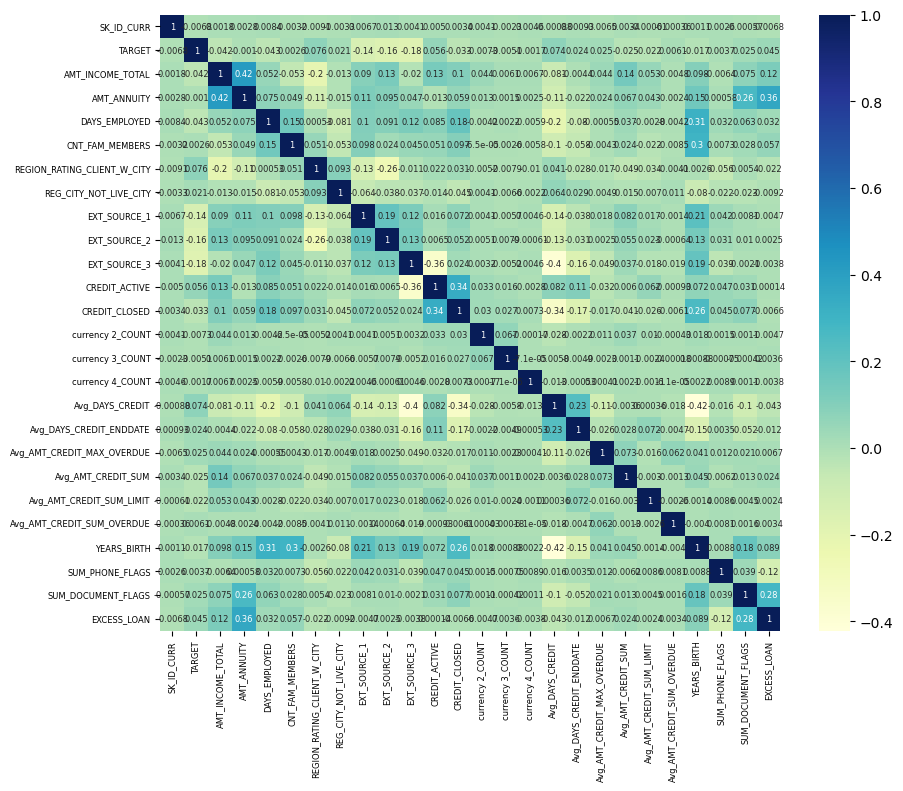

In [43]:
# Filter the DataFrame to keep only the numerical columns
numerical_test_df_update = target_df.select_dtypes(include=['number'])

# Calculate the correlation for the numerical columns
correlation_matrix_update = numerical_test_df_update.corr()
# Create a heatmap with smaller font size for annotations
# Adjust font size for x-axis and y-axis labels
fig, ax = plt.subplots(figsize=(10, 8))

# Create the heatmap
heatmap = sns.heatmap(correlation_matrix_update, cmap="YlGnBu", annot=True, ax=ax,annot_kws={"size": 6})

# Adjust the font size of x-axis and y-axis labels
heatmap.set_xticklabels(heatmap.get_xticklabels(), size=6)
heatmap.set_yticklabels(heatmap.get_yticklabels(), size=6)

plt.show()

In [42]:
target_df.shape

(42524, 31)

# Calculating WOE and IV

In [43]:
target_df[['TARGET']].info()

<class 'pandas.core.frame.DataFrame'>
Index: 42524 entries, 0 to 42636
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   TARGET  42524 non-null  float64
dtypes: float64(1)
memory usage: 664.4 KB


In [44]:
#convert TARGET column to int type
target_df['TARGET'] = target_df['TARGET'].astype(int)

### WOE and IV

In [45]:
# automatically calculate bin ranges 
import scorecardpy as sc
import pprint

bins = sc.woebin(target_df, y='TARGET')

[INFO] creating woe binning ...
>>> There are 1 variables have too many unique non-numberic values, which might cause the binning process slow. Please double check the following variables: 
ORGANIZATION_TYPE
>>> Continue the binning process?
1: yes 
2: no


Binning on 42524 rows and 31 columns in 00:00:21


{'currency 2_COUNT': <Figure size 640x480 with 2 Axes>,
 'Avg_DAYS_CREDIT_ENDDATE': <Figure size 640x480 with 2 Axes>,
 'currency 3_COUNT': <Figure size 640x480 with 2 Axes>,
 'Avg_AMT_CREDIT_MAX_OVERDUE': <Figure size 640x480 with 2 Axes>,
 'REG_CITY_NOT_LIVE_CITY': <Figure size 640x480 with 2 Axes>,
 'currency 4_COUNT': <Figure size 640x480 with 2 Axes>,
 'EXT_SOURCE_2': <Figure size 640x480 with 2 Axes>,
 'Avg_DAYS_CREDIT': <Figure size 640x480 with 2 Axes>,
 'Avg_AMT_CREDIT_SUM': <Figure size 640x480 with 2 Axes>,
 'NAME_EDUCATION_TYPE': <Figure size 640x480 with 2 Axes>,
 'CNT_CHILDREN': <Figure size 640x480 with 2 Axes>,
 'YEARS_BIRTH': <Figure size 640x480 with 2 Axes>,
 'DAYS_EMPLOYED': <Figure size 640x480 with 2 Axes>,
 'Avg_AMT_CREDIT_SUM_LIMIT': <Figure size 640x480 with 2 Axes>,
 'OCCUPATION_TYPE': <Figure size 640x480 with 2 Axes>,
 'NAME_INCOME_TYPE': <Figure size 640x480 with 2 Axes>,
 'Avg_AMT_CREDIT_SUM_OVERDUE': <Figure size 640x480 with 2 Axes>,
 'ORGANIZATION_TYPE'

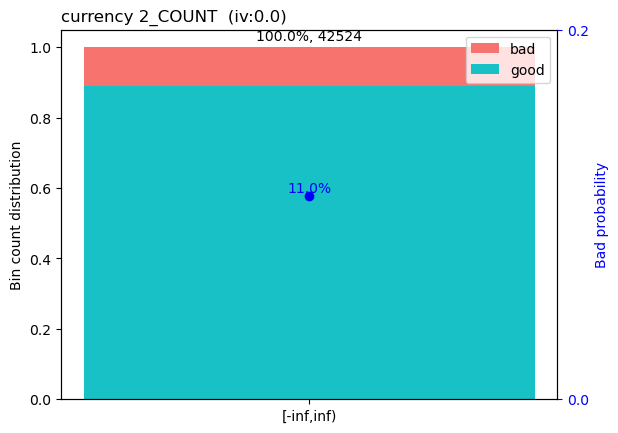

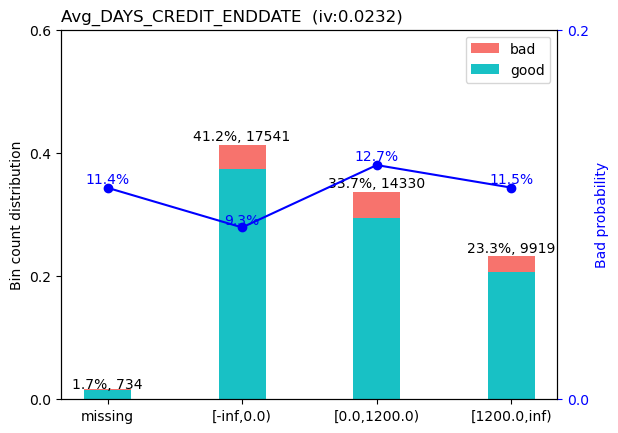

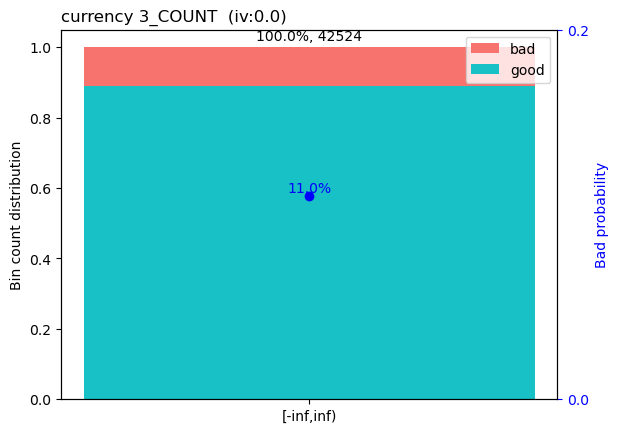

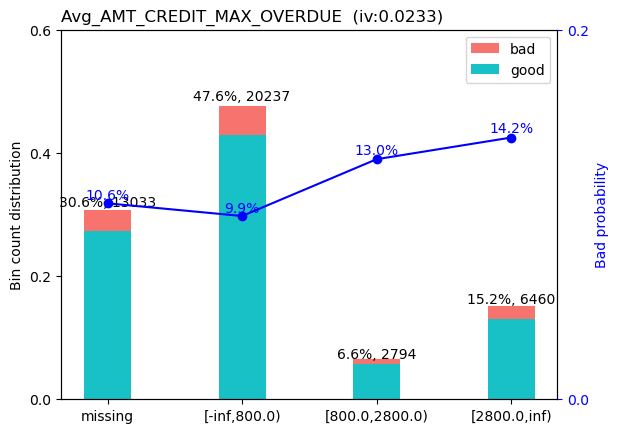

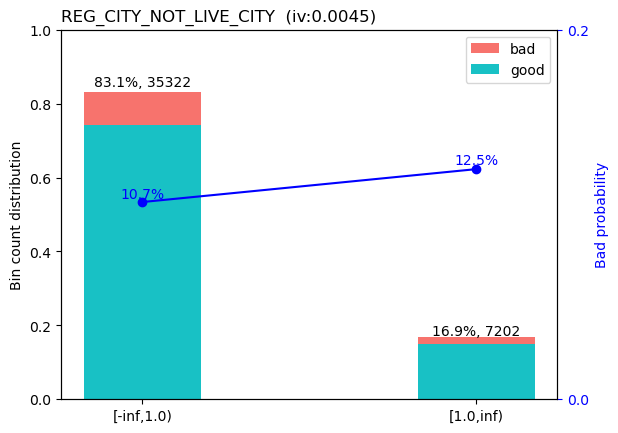

...

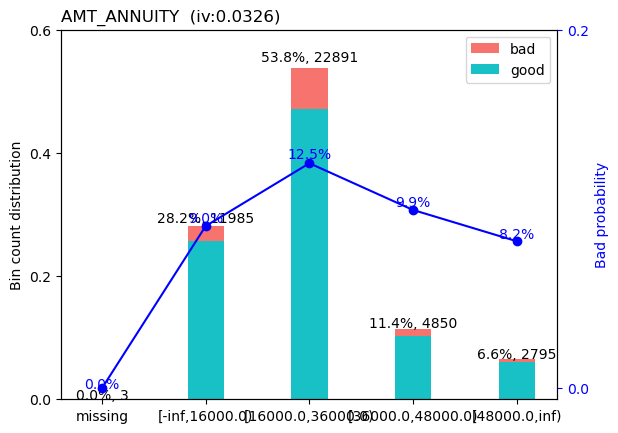

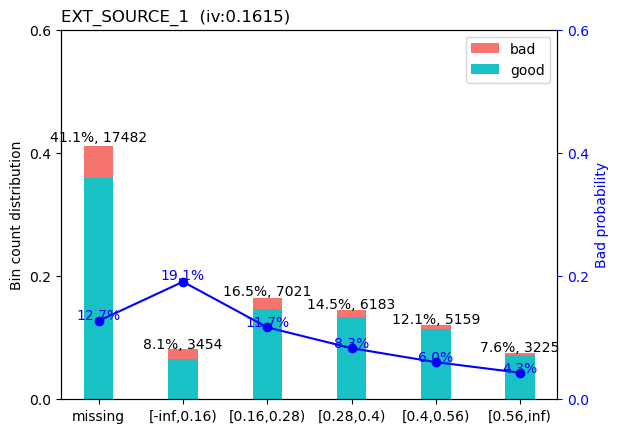

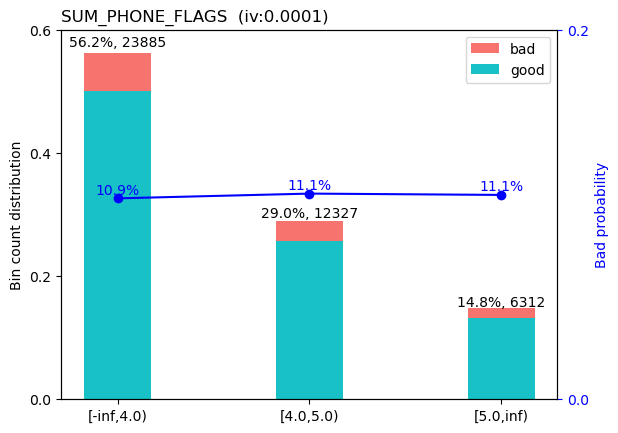

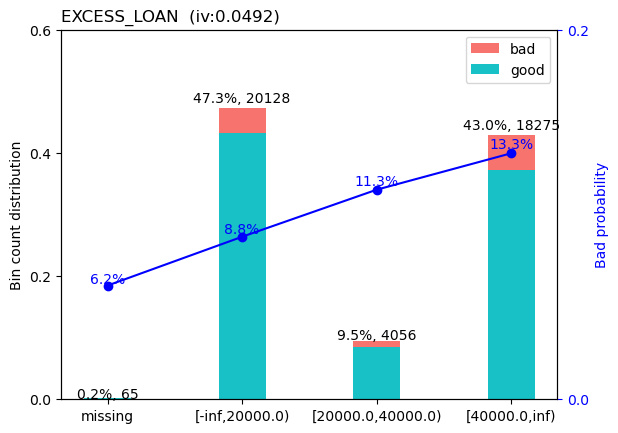

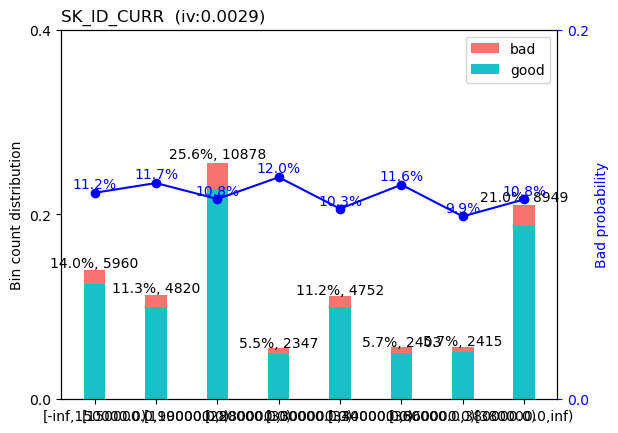

In [216]:
# plot the bins
sc.woebin_plot(bins)

In [46]:
all_IV = {}
for n in bins.keys():
    all_IV[n] = bins[n].total_iv.iloc[0]

# Sort the dictionary items by values in descending order
sorted_IV = dict(sorted(all_IV.items(), key=lambda item: item[1], reverse=True))

sorted_IV

{'EXT_SOURCE_3': 0.2970320905195953,
 'EXT_SOURCE_2': 0.24750941090504391,
 'EXT_SOURCE_1': 0.16145209148368728,
 'NAME_EDUCATION_TYPE': 0.12327113537446847,
 'Avg_DAYS_CREDIT': 0.07372418009489842,
 'OCCUPATION_TYPE': 0.0642512120225725,
 'REGION_RATING_CLIENT_W_CITY': 0.06341713032340965,
 'EXCESS_LOAN': 0.049183259915592845,
 'ORGANIZATION_TYPE': 0.04902437966124821,
 'Avg_AMT_CREDIT_SUM': 0.03283064637630767,
 'AMT_ANNUITY': 0.03257884474467163,
 'SUM_DOCUMENT_FLAGS': 0.029368465212611706,
 'AMT_INCOME_TOTAL': 0.026839369095768072,
 'CREDIT_ACTIVE': 0.025927038577130315,
 'NAME_INCOME_TYPE': 0.025511552028309507,
 'CREDIT_CLOSED': 0.02350331600282816,
 'Avg_AMT_CREDIT_MAX_OVERDUE': 0.023333196337035296,
 'Avg_DAYS_CREDIT_ENDDATE': 0.023193885694770613,
 'DAYS_EMPLOYED': 0.023075123804997176,
 'Avg_AMT_CREDIT_SUM_LIMIT': 0.008506924834573167,
 'YEARS_BIRTH': 0.00649078034539537,
 'REG_CITY_NOT_LIVE_CITY': 0.004476908965707123,
 'SK_ID_CURR': 0.002860745175737172,
 'CNT_CHILDREN': 0.

##### Filter top 20 IVs

In [47]:
#from above, sort out top 20 and see from there
top_20_IV = dict(list(sorted_IV.items())[:20])
top_20_IV

{'EXT_SOURCE_3': 0.2970320905195953,
 'EXT_SOURCE_2': 0.24750941090504391,
 'EXT_SOURCE_1': 0.16145209148368728,
 'NAME_EDUCATION_TYPE': 0.12327113537446847,
 'Avg_DAYS_CREDIT': 0.07372418009489842,
 'OCCUPATION_TYPE': 0.0642512120225725,
 'REGION_RATING_CLIENT_W_CITY': 0.06341713032340965,
 'EXCESS_LOAN': 0.049183259915592845,
 'ORGANIZATION_TYPE': 0.04902437966124821,
 'Avg_AMT_CREDIT_SUM': 0.03283064637630767,
 'AMT_ANNUITY': 0.03257884474467163,
 'SUM_DOCUMENT_FLAGS': 0.029368465212611706,
 'AMT_INCOME_TOTAL': 0.026839369095768072,
 'CREDIT_ACTIVE': 0.025927038577130315,
 'NAME_INCOME_TYPE': 0.025511552028309507,
 'CREDIT_CLOSED': 0.02350331600282816,
 'Avg_AMT_CREDIT_MAX_OVERDUE': 0.023333196337035296,
 'Avg_DAYS_CREDIT_ENDDATE': 0.023193885694770613,
 'DAYS_EMPLOYED': 0.023075123804997176,
 'Avg_AMT_CREDIT_SUM_LIMIT': 0.008506924834573167}

# Top 8 Variables 

In [219]:
# Get the top 8 IVs
top_8_IVs = dict(sorted(top_20_IV.items(), key=lambda item: item[1], reverse=True)[:7])
top_8_IVs

{'EXT_SOURCE_3': 0.2970320905195953,
 'EXT_SOURCE_2': 0.24750941090504391,
 'EXT_SOURCE_1': 0.16145209148368728,
 'NAME_EDUCATION_TYPE': 0.12327113537446847,
 'Avg_DAYS_CREDIT': 0.07372418009489842,
 'OCCUPATION_TYPE': 0.0642512120225725,
 'REGION_RATING_CLIENT_W_CITY': 0.06341713032340965}

In [220]:
# Assuming top_8_IVs is a dictionary with the top 8 IV columns
top_8_columns = list(top_8_IVs.keys())

# Filter the DataFrame to keep only the top 8 columns
df_top_8 = target_df[top_8_columns + ['TARGET'] + ['AMT_INCOME_TOTAL']]
df_top_8.head()

,EXT_SOURCE_3,EXT_SOURCE_2,EXT_SOURCE_1,NAME_EDUCATION_TYPE,Avg_DAYS_CREDIT,OCCUPATION_TYPE,REGION_RATING_CLIENT_W_CITY,TARGET,AMT_INCOME_TOTAL
0,0.80,0.41,NaN,Higher education,-1344.50,Core staff,2.00,0,171000.00
1,0.38,0.56,NaN,Incomplete higher,-959.12,Core staff,2.00,0,315000.00
2,0.15,0.53,0.63,Secondary / secondary special,-1427.43,NaN,2.00,0,150039.00
3,0.41,0.54,0.27,Higher education,-1607.11,Laborers,2.00,1,135000.00
4,0.15,0.26,NaN,Secondary / secondary special,-137.00,Drivers,2.00,0,135000.00


#### Bin

[INFO] creating woe binning ...


{'OCCUPATION_TYPE': <Figure size 640x480 with 2 Axes>,
 'EXT_SOURCE_3': <Figure size 640x480 with 2 Axes>,
 'REGION_RATING_CLIENT_W_CITY': <Figure size 640x480 with 2 Axes>,
 'EXT_SOURCE_2': <Figure size 640x480 with 2 Axes>,
 'Avg_DAYS_CREDIT': <Figure size 640x480 with 2 Axes>,
 'AMT_INCOME_TOTAL': <Figure size 640x480 with 2 Axes>,
 'EXT_SOURCE_1': <Figure size 640x480 with 2 Axes>,
 'NAME_EDUCATION_TYPE': <Figure size 640x480 with 2 Axes>}

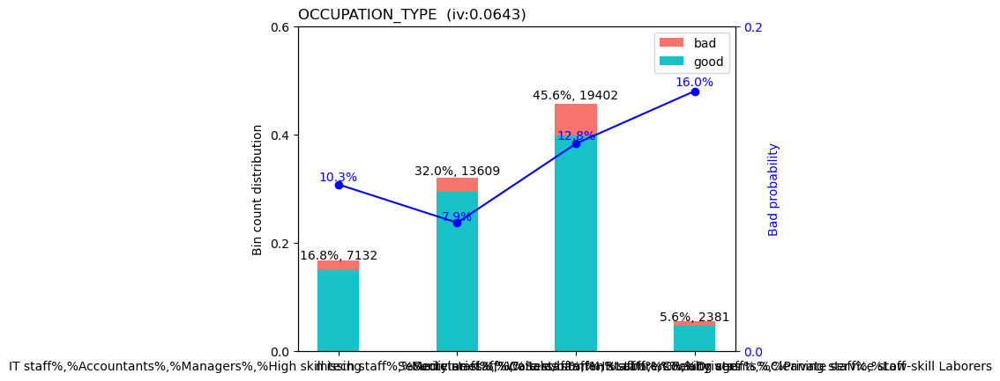

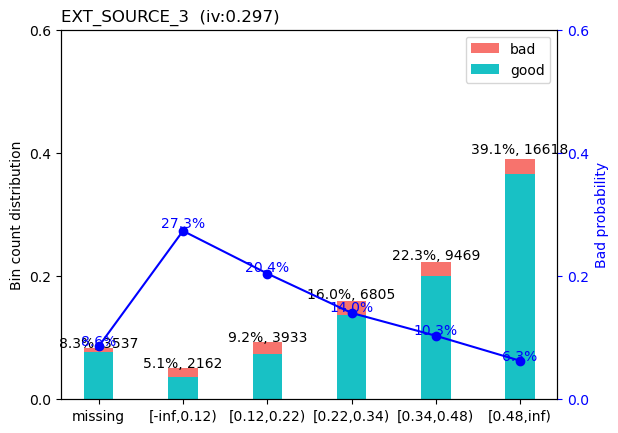

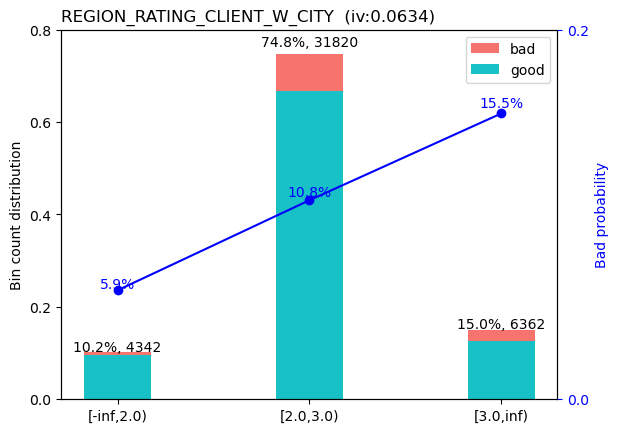

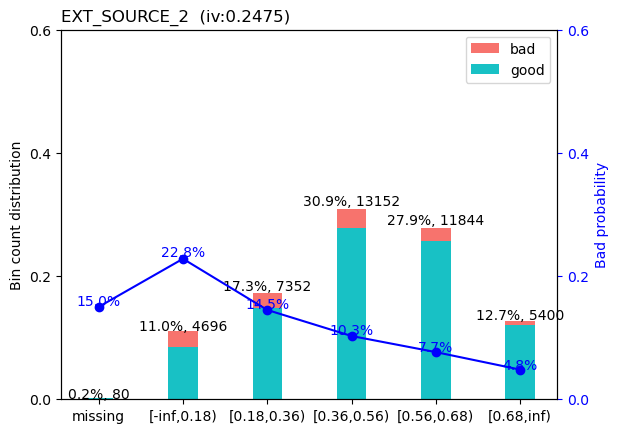

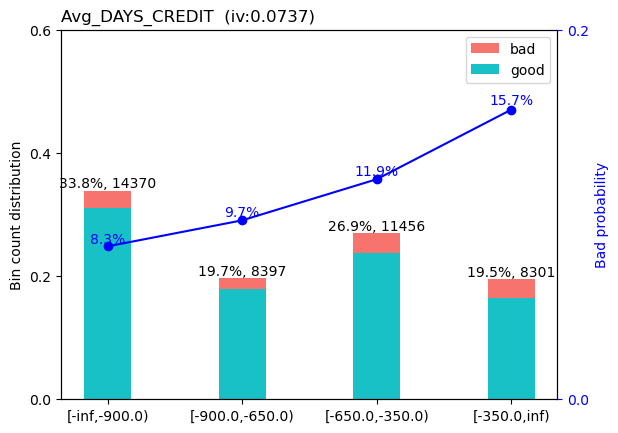

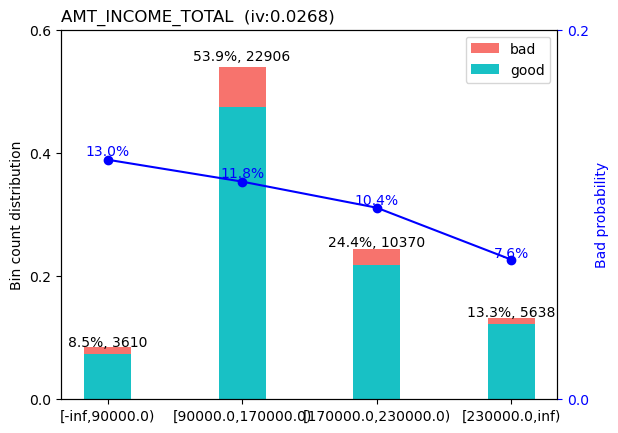

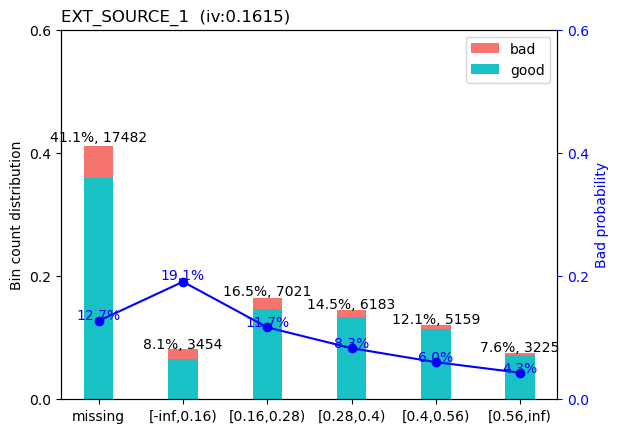

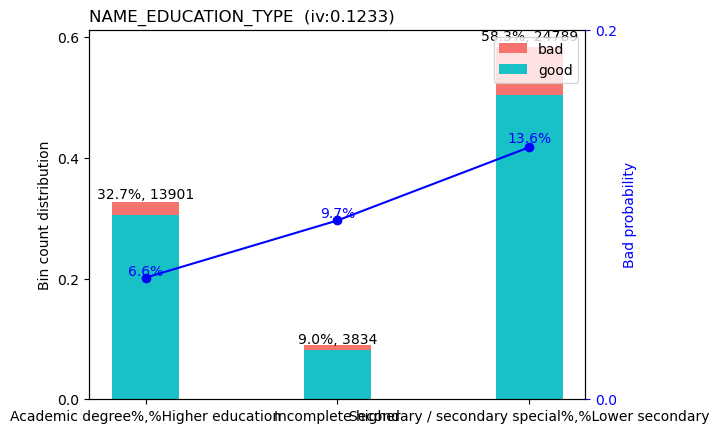

In [296]:
bins = sc.woebin(df_top_8, y='TARGET')

# plot the bins
sc.woebin_plot(bins)
#the below plots, show that the plots are generally monotonic


### Split Data

In [297]:
# split data into 70% train and 30% test
train, test = sc.split_df(df_top_8, 'TARGET', ratio=0.7).values()
print(train.shape)
print(test.shape)
#train.value_counts()

(29767, 9)
(12757, 9)


#### WOE Encoding 


In [298]:
# prepare a dataset with the WOE values for Logistic Regression training
# woebin_ply() converts original values of input data into woe
train_woe = sc.woebin_ply(train, bins)
test_woe = sc.woebin_ply(test, bins)

[INFO] converting into woe values ...
[INFO] converting into woe values ...


### Training & Testing 

In [299]:
#create the X, y parts of data for train and test
y_train = train_woe.loc[:,'TARGET']
X_train = train_woe.loc[:,train_woe.columns != 'TARGET']
y_test = test_woe.loc[:,'TARGET']
X_test = test_woe.loc[:,train_woe.columns != 'TARGET']


### Run Logistic Regression 

In [300]:
#create a logistic regression model object
lr = LogisticRegression(solver='newton-cg', class_weight='balanced')
lr.fit(X_train, y_train)
print(lr.coef_)
print(lr.intercept_)

[[0.43803867 0.92768098 0.57489287 0.69876833 0.10917855 0.29776502
  0.66288568 0.56665403]]
[-0.00290343]


### Scorecard Construction 

In [301]:
#generate a card from the model and bins. The scores will be based on probability of default from the model
card = sc.scorecard(bins, lr, X_train.columns, points0 = 600, odds0 = 1/3, pdo =20 ,
      basepoints_eq0 = True)

pprint.pprint(card)


{'AMT_INCOME_TOTAL':             variable                  bin  points
23  AMT_INCOME_TOTAL       [-inf,90000.0)   69.00
24  AMT_INCOME_TOTAL   [90000.0,170000.0)   70.00
25  AMT_INCOME_TOTAL  [170000.0,230000.0)   72.00
26  AMT_INCOME_TOTAL       [230000.0,inf)   75.00,
 'Avg_DAYS_CREDIT':            variable              bin  points
19  Avg_DAYS_CREDIT    [-inf,-900.0)   72.00
20  Avg_DAYS_CREDIT  [-900.0,-650.0)   71.00
21  Avg_DAYS_CREDIT  [-650.0,-350.0)   71.00
22  Avg_DAYS_CREDIT     [-350.0,inf)   70.00,
 'EXT_SOURCE_1':         variable          bin  points
27  EXT_SOURCE_1      missing   68.00
28  EXT_SOURCE_1  [-inf,0.16)   59.00
29  EXT_SOURCE_1  [0.16,0.28)   70.00
30  EXT_SOURCE_1   [0.28,0.4)   77.00
31  EXT_SOURCE_1   [0.4,0.56)   84.00
32  EXT_SOURCE_1   [0.56,inf)   90.00,
 'EXT_SOURCE_2':         variable          bin  points
13  EXT_SOURCE_2      missing   64.00
14  EXT_SOURCE_2  [-inf,0.18)   53.00
15  EXT_SOURCE_2  [0.18,0.36)   65.00
16  EXT_SOURCE_2  [0.36,0.56)

#### Train & Test of Scorecard

array([[<Axes: title={'center': 'score'}>]], dtype=object)

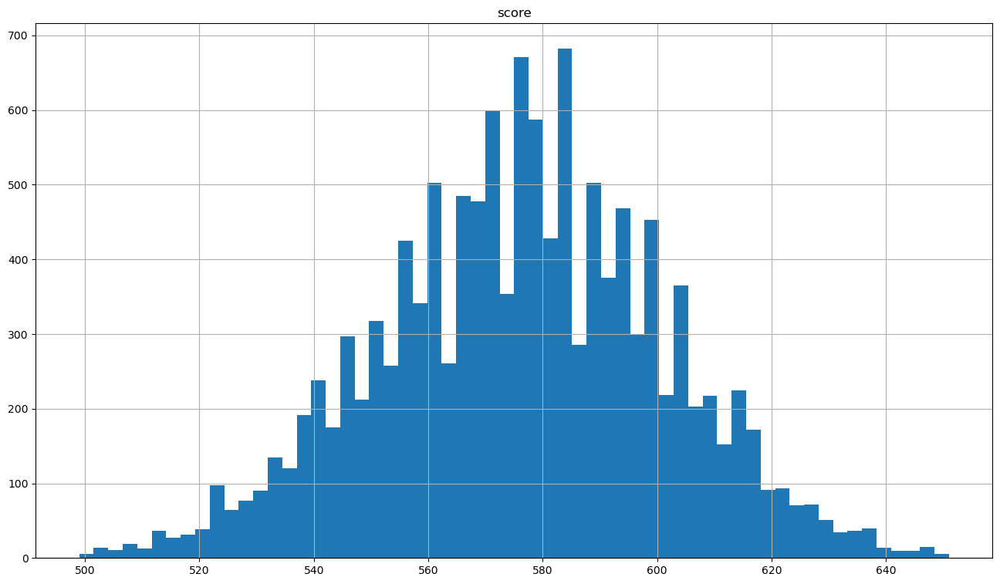

In [302]:
# credit score for samples in test and train
train_score = sc.scorecard_ply(train, card)
test_score = sc.scorecard_ply(test, card)

# plot the distrubution of scores on test data
test_score.hist(figsize=(16,9),bins=60)


In [303]:
# print evaluation metrics of the model
y_pred = lr.predict(X_test)

### Confusion Matrix

In [304]:
print("Confusion matrix:")
print(confusion_matrix(y_pred, y_test))
print("\nPCC measures:")
print(classification_report(y_pred, y_test))


Confusion matrix:
[[7650  459]
 [3707  941]]

PCC measures:
              precision    recall  f1-score   support

           0       0.67      0.94      0.79      8109
           1       0.67      0.20      0.31      4648

    accuracy                           0.67     12757
   macro avg       0.67      0.57      0.55     12757
weighted avg       0.67      0.67      0.61     12757



### ROC AUC

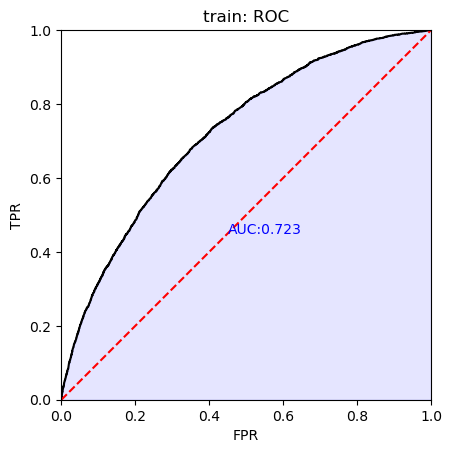

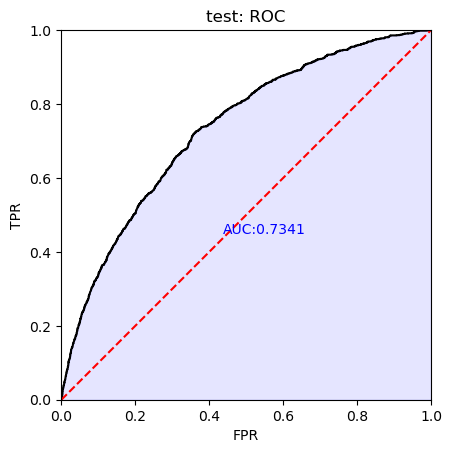

In [230]:
# evaluate the performance of the logistic regression
train_pred = lr.predict_proba(X_train)[:,1]
test_pred = lr.predict_proba(X_test)[:,1]

# performance ks & roc
train_perf = sc.perf_eva(y_train, train_pred, plot_type=['roc'], title = "train")
test_perf = sc.perf_eva(y_test, test_pred, plot_type=['roc'], title = "test")

# Analysis and Tuning 

# Top 9 Variables

In [231]:
# Get the top 9 IVs
top_9_IVs = dict(sorted(top_20_IV.items(), key=lambda item: item[1], reverse=True)[:8])
top_9_IVs

{'EXT_SOURCE_3': 0.2970320905195953,
 'EXT_SOURCE_2': 0.24750941090504391,
 'EXT_SOURCE_1': 0.16145209148368728,
 'NAME_EDUCATION_TYPE': 0.12327113537446847,
 'Avg_DAYS_CREDIT': 0.07372418009489842,
 'OCCUPATION_TYPE': 0.0642512120225725,
 'REGION_RATING_CLIENT_W_CITY': 0.06341713032340965,
 'EXCESS_LOAN': 0.049183259915592845}

In [232]:
# Assuming top_15_IVs is a dictionary with the top 9 IV columns
top_9_columns = list(top_9_IVs.keys())

# Filter the DataFrame to keep only the top 9 columns
df_top_9 = target_df[top_9_columns + ['TARGET'] + ['AMT_INCOME_TOTAL']]
df_top_9.head()

,EXT_SOURCE_3,EXT_SOURCE_2,EXT_SOURCE_1,NAME_EDUCATION_TYPE,Avg_DAYS_CREDIT,OCCUPATION_TYPE,REGION_RATING_CLIENT_W_CITY,EXCESS_LOAN,TARGET,AMT_INCOME_TOTAL
0,0.80,0.41,NaN,Higher education,-1344.50,Core staff,2.00,55062.00,0,171000.00
1,0.38,0.56,NaN,Incomplete higher,-959.12,Core staff,2.00,142560.00,0,315000.00
2,0.15,0.53,0.63,Secondary / secondary special,-1427.43,NaN,2.00,0.00,0,150039.00
3,0.41,0.54,0.27,Higher education,-1607.11,Laborers,2.00,59400.00,1,135000.00
4,0.15,0.26,NaN,Secondary / secondary special,-137.00,Drivers,2.00,44550.00,0,135000.00


#### Bin

In [233]:
bins = sc.woebin(df_top_9, y='TARGET')



[INFO] creating woe binning ...


{'OCCUPATION_TYPE': <Figure size 640x480 with 2 Axes>,
 'EXT_SOURCE_3': <Figure size 640x480 with 2 Axes>,
 'REGION_RATING_CLIENT_W_CITY': <Figure size 640x480 with 2 Axes>,
 'EXT_SOURCE_2': <Figure size 640x480 with 2 Axes>,
 'Avg_DAYS_CREDIT': <Figure size 640x480 with 2 Axes>,
 'AMT_INCOME_TOTAL': <Figure size 640x480 with 2 Axes>,
 'EXT_SOURCE_1': <Figure size 640x480 with 2 Axes>,
 'NAME_EDUCATION_TYPE': <Figure size 640x480 with 2 Axes>,
 'EXCESS_LOAN': <Figure size 640x480 with 2 Axes>}

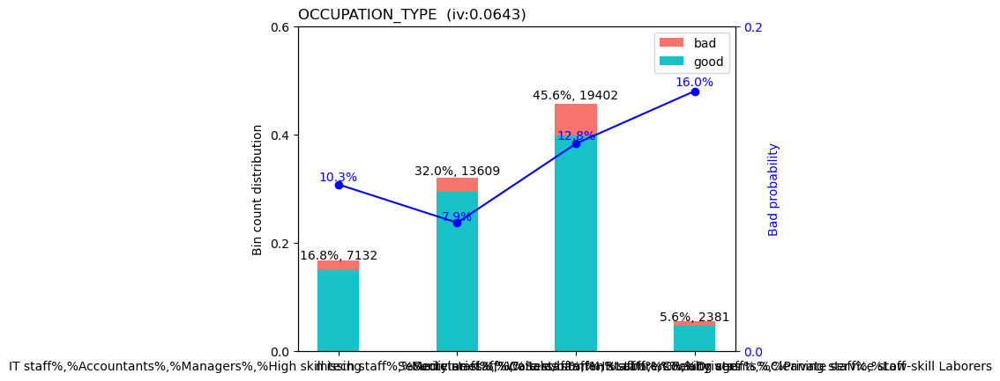

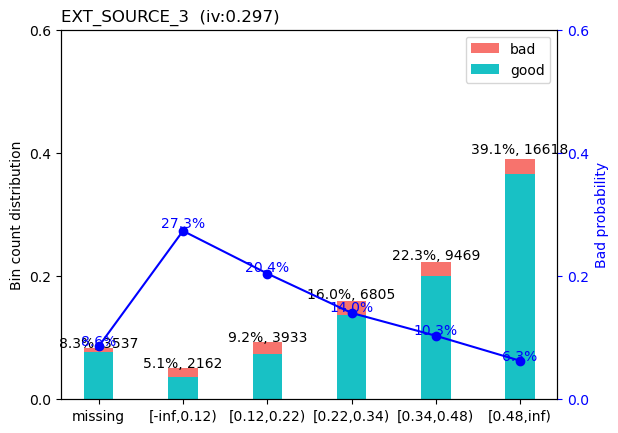

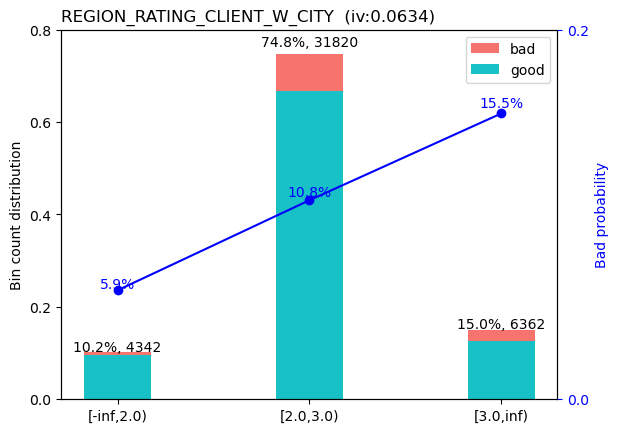

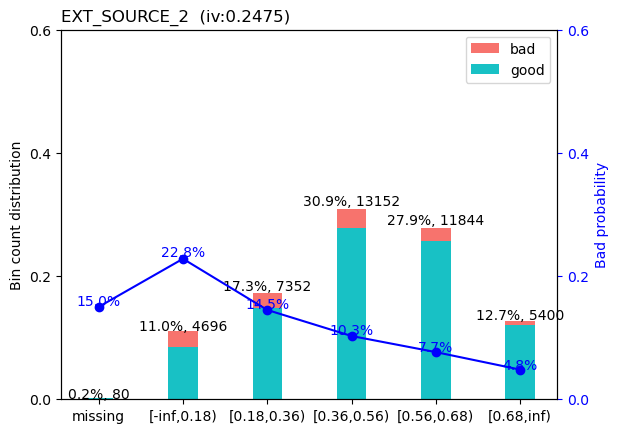

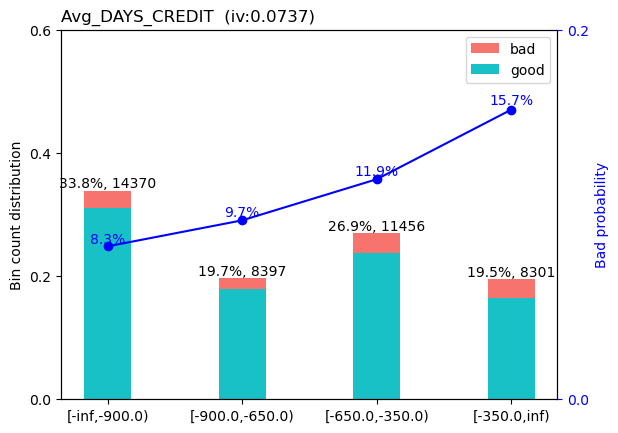

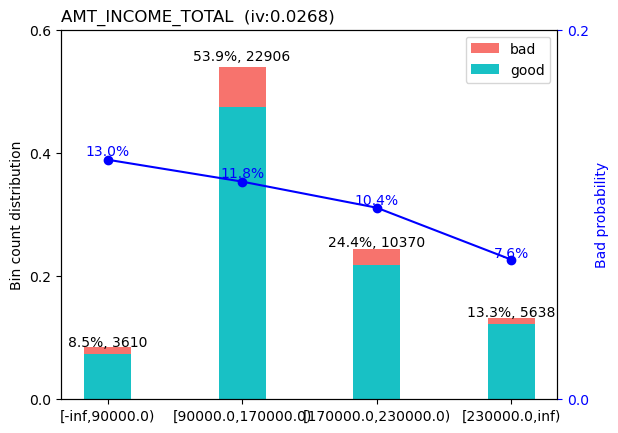

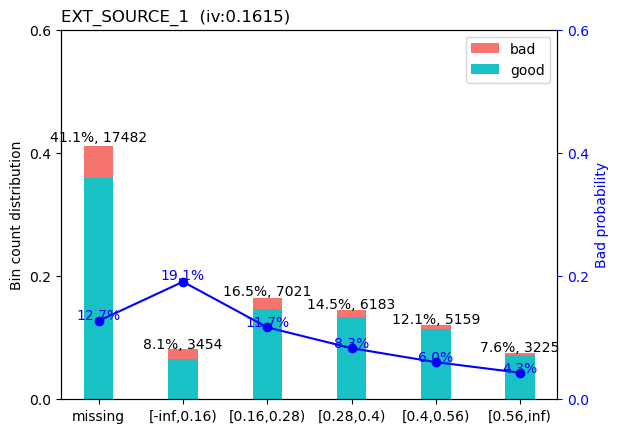

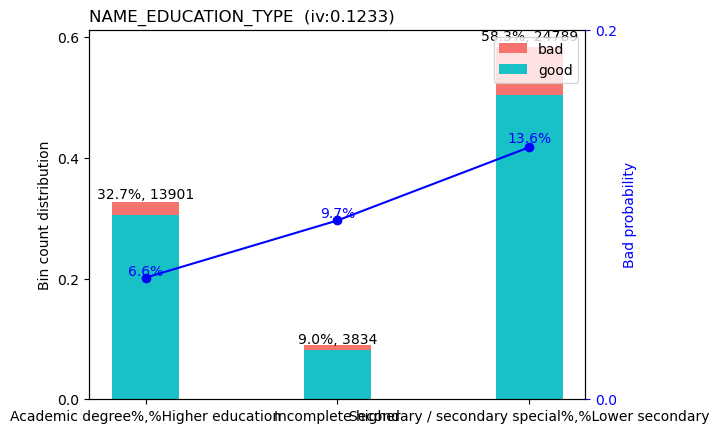

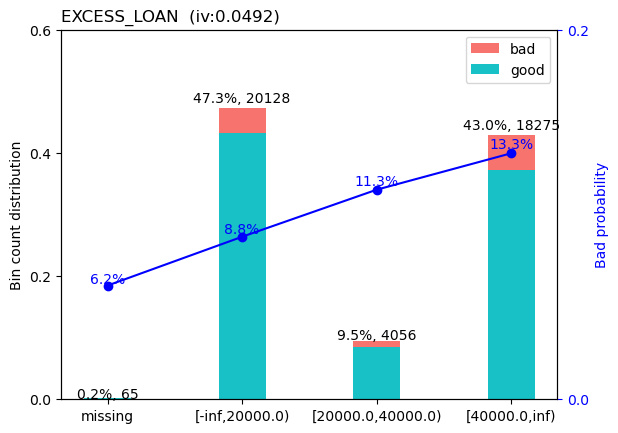

In [234]:
# plot the bins
sc.woebin_plot(bins)

### Split Data

In [235]:
# split data into 70% train and 30% test
train, test = sc.split_df(df_top_9, 'TARGET', ratio=0.7).values()
print(train.shape)
print(test.shape)

(29767, 10)
(12757, 10)


#### WOE Encoding 

In [236]:
# prepare a dataset with the WOE values for Logistic Regression training
# woebin_ply() converts original values of input data into woe
train_woe = sc.woebin_ply(train, bins)
test_woe = sc.woebin_ply(test, bins)

[INFO] converting into woe values ...
[INFO] converting into woe values ...


### Training & Testing 

In [237]:
#create the X, y parts of data for train and test
y_train = train_woe.loc[:,'TARGET']
X_train = train_woe.loc[:,train_woe.columns != 'TARGET']
y_test = test_woe.loc[:,'TARGET']
X_test = test_woe.loc[:,train_woe.columns != 'TARGET']



### Run Logistic Regression 

In [238]:
#create a logistic regression model object
lr = LogisticRegression(solver='newton-cg', class_weight='balanced')
lr.fit(X_train, y_train)
print(lr.coef_)
print(lr.intercept_)

[[0.42196981 0.92440604 0.55257079 0.68611621 0.14720454 0.42975131
  0.66176448 0.53642211 0.86241713]]
[-0.00207019]


### Scorecard Construction 

In [239]:
#generate a card from the model and bins. The scores will be based on probability of default from the model
card = sc.scorecard(bins, lr, X_train.columns, points0 = 600, odds0 = 1/3, pdo = 20,
      basepoints_eq0 = True)

pprint.pprint(card)

{'AMT_INCOME_TOTAL':             variable                  bin  points
23  AMT_INCOME_TOTAL       [-inf,90000.0)   61.00
24  AMT_INCOME_TOTAL   [90000.0,170000.0)   62.00
25  AMT_INCOME_TOTAL  [170000.0,230000.0)   64.00
26  AMT_INCOME_TOTAL       [230000.0,inf)   68.00,
 'Avg_DAYS_CREDIT':            variable              bin  points
19  Avg_DAYS_CREDIT    [-inf,-900.0)   64.00
20  Avg_DAYS_CREDIT  [-900.0,-650.0)   64.00
21  Avg_DAYS_CREDIT  [-650.0,-350.0)   63.00
22  Avg_DAYS_CREDIT     [-350.0,inf)   61.00,
 'EXCESS_LOAN':        variable                bin  points
36  EXCESS_LOAN            missing   79.00
37  EXCESS_LOAN     [-inf,20000.0)   69.00
38  EXCESS_LOAN  [20000.0,40000.0)   62.00
39  EXCESS_LOAN      [40000.0,inf)   58.00,
 'EXT_SOURCE_1':         variable          bin  points
27  EXT_SOURCE_1      missing   60.00
28  EXT_SOURCE_1  [-inf,0.16)   51.00
29  EXT_SOURCE_1  [0.16,0.28)   62.00
30  EXT_SOURCE_1   [0.28,0.4)   69.00
31  EXT_SOURCE_1   [0.4,0.56)   76.00
32  E

#### Train & Test of Scorecard

array([[<Axes: title={'center': 'score'}>]], dtype=object)

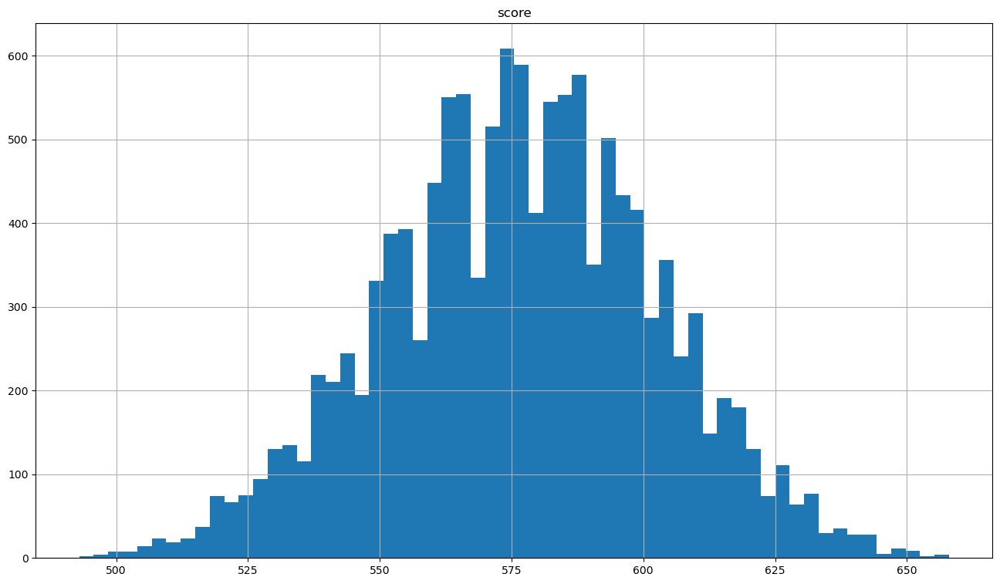

In [240]:
# credit score for samples in test and train
train_score = sc.scorecard_ply(train, card)
test_score = sc.scorecard_ply(test, card)

# plot the distrubution of scores on test data
test_score.hist(figsize=(16,9),bins=60)

In [241]:
# print evaluation metrics of the model
y_pred = lr.predict(X_test)

### Confusion Matrix

In [242]:
print("Confusion matrix:")
print(confusion_matrix(y_pred, y_test))
print("\nPCC measures:")
print(classification_report(y_pred, y_test))


Confusion matrix:
[[7611  429]
 [3746  971]]

PCC measures:
              precision    recall  f1-score   support

           0       0.67      0.95      0.78      8040
           1       0.69      0.21      0.32      4717

    accuracy                           0.67     12757
   macro avg       0.68      0.58      0.55     12757
weighted avg       0.68      0.67      0.61     12757



### ROC AUC

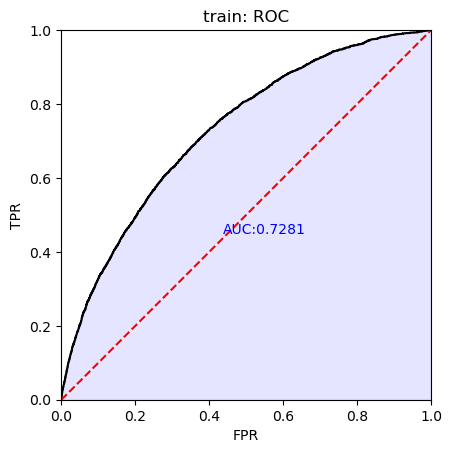

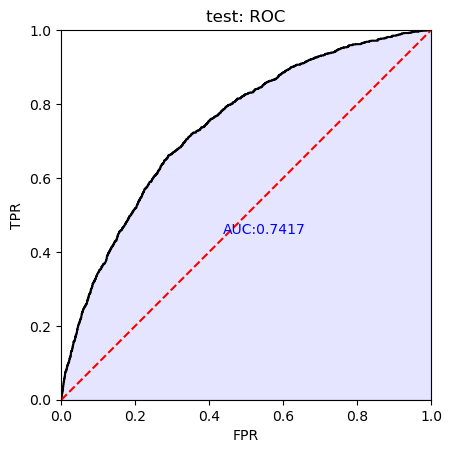

In [243]:
# evaluate the performance of the logistic regression
train_pred = lr.predict_proba(X_train)[:,1]
test_pred = lr.predict_proba(X_test)[:,1]

# performance ks & roc
train_perf = sc.perf_eva(y_train, train_pred, plot_type=['roc'], title = "train")
test_perf = sc.perf_eva(y_test, test_pred, plot_type=['roc'], title = "test")

# Top 11 Variables

In [48]:
# Get the top 11 IVs
top_11_IVs = dict(sorted(top_20_IV.items(), key=lambda item: item[1], reverse=True)[:10])
top_11_IVs

{'EXT_SOURCE_3': 0.2970320905195953,
 'EXT_SOURCE_2': 0.24750941090504391,
 'EXT_SOURCE_1': 0.16145209148368728,
 'NAME_EDUCATION_TYPE': 0.12327113537446847,
 'Avg_DAYS_CREDIT': 0.07372418009489842,
 'OCCUPATION_TYPE': 0.0642512120225725,
 'REGION_RATING_CLIENT_W_CITY': 0.06341713032340965,
 'EXCESS_LOAN': 0.049183259915592845,
 'ORGANIZATION_TYPE': 0.04902437966124821,
 'Avg_AMT_CREDIT_SUM': 0.03283064637630767}

In [49]:
# Assuming top_15_IVs is a dictionary with the top 9 IV columns
top_11_columns = list(top_11_IVs.keys())

# Filter the DataFrame to keep only the top 9 columns
df_top_11 = target_df[top_11_columns + ['TARGET'] + ['AMT_INCOME_TOTAL']]
df_top_11.head()

,EXT_SOURCE_3,EXT_SOURCE_2,EXT_SOURCE_1,NAME_EDUCATION_TYPE,Avg_DAYS_CREDIT,OCCUPATION_TYPE,REGION_RATING_CLIENT_W_CITY,EXCESS_LOAN,ORGANIZATION_TYPE,Avg_AMT_CREDIT_SUM,TARGET,AMT_INCOME_TOTAL
0,0.80,0.41,NaN,Higher education,-1344.50,Core staff,2.00,55062.00,Police,1371731.03,0,171000.00
1,0.38,0.56,NaN,Incomplete higher,-959.12,Core staff,2.00,142560.00,Military,894870.00,0,315000.00
2,0.15,0.53,0.63,Secondary / secondary special,-1427.43,NaN,2.00,0.00,Industry: type 3,243305.36,0,150039.00
3,0.41,0.54,0.27,Higher education,-1607.11,Laborers,2.00,59400.00,Business Entity Type 3,114134.60,1,135000.00
4,0.15,0.26,NaN,Secondary / secondary special,-137.00,Drivers,2.00,44550.00,Business Entity Type 3,22500.00,0,135000.00


#### Bin

In [50]:
bins = sc.woebin(df_top_11, y='TARGET')



[INFO] creating woe binning ...
>>> There are 1 variables have too many unique non-numberic values, which might cause the binning process slow. Please double check the following variables: 
ORGANIZATION_TYPE
>>> Continue the binning process?
1: yes 
2: no
Binning on 42524 rows and 12 columns in 00:00:10


{'OCCUPATION_TYPE': <Figure size 640x480 with 2 Axes>,
 'ORGANIZATION_TYPE': <Figure size 640x480 with 2 Axes>,
 'EXT_SOURCE_3': <Figure size 640x480 with 2 Axes>,
 'REGION_RATING_CLIENT_W_CITY': <Figure size 640x480 with 2 Axes>,
 'EXT_SOURCE_2': <Figure size 640x480 with 2 Axes>,
 'Avg_DAYS_CREDIT': <Figure size 640x480 with 2 Axes>,
 'AMT_INCOME_TOTAL': <Figure size 640x480 with 2 Axes>,
 'Avg_AMT_CREDIT_SUM': <Figure size 640x480 with 2 Axes>,
 'EXT_SOURCE_1': <Figure size 640x480 with 2 Axes>,
 'NAME_EDUCATION_TYPE': <Figure size 640x480 with 2 Axes>,
 'EXCESS_LOAN': <Figure size 640x480 with 2 Axes>}

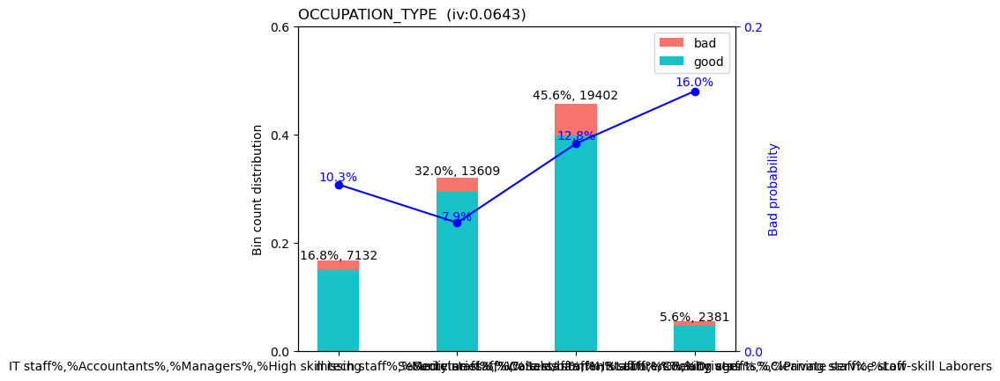

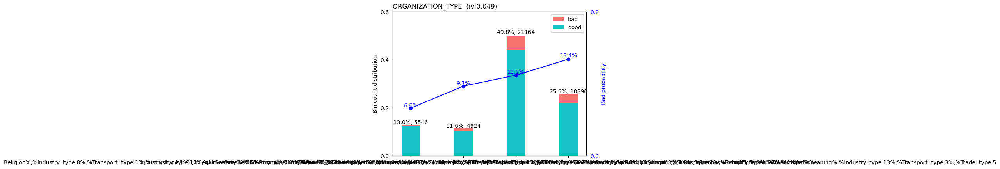

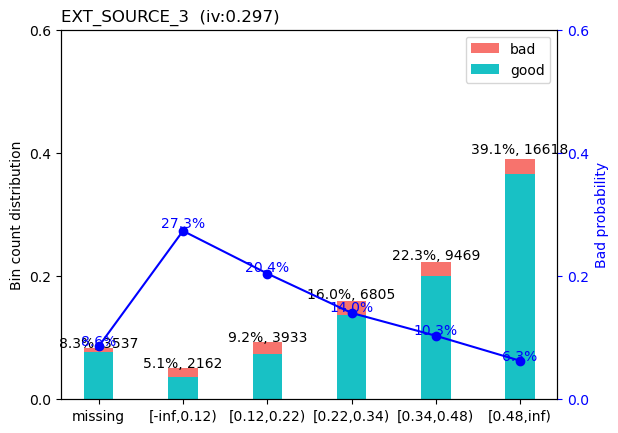

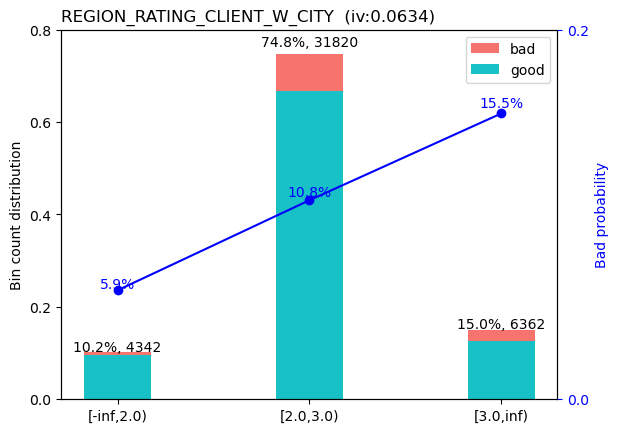

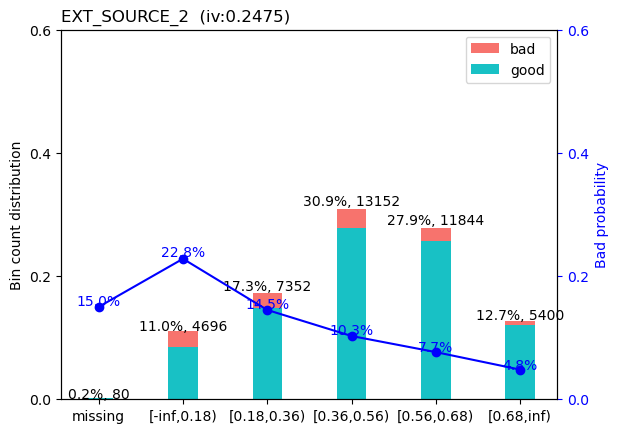

...

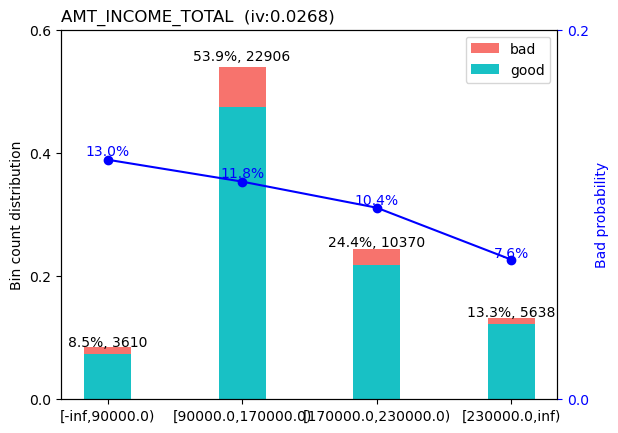

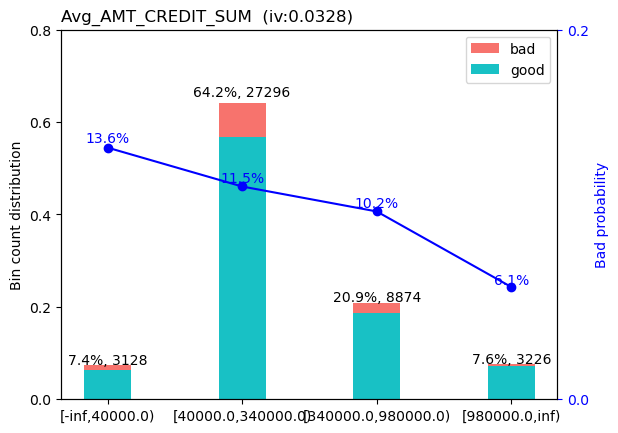

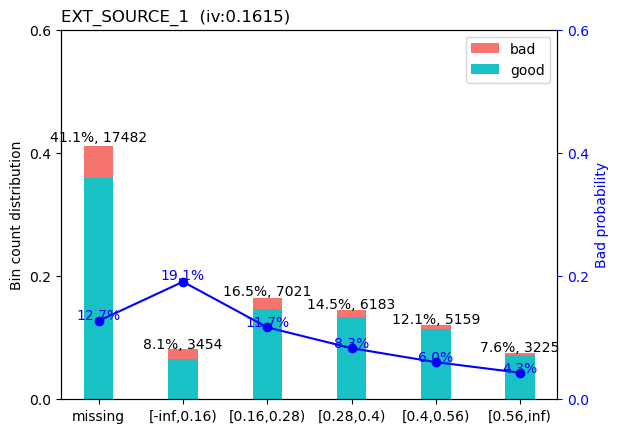

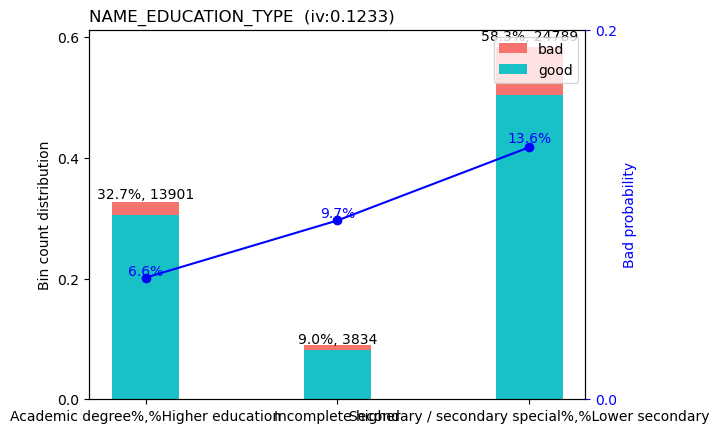

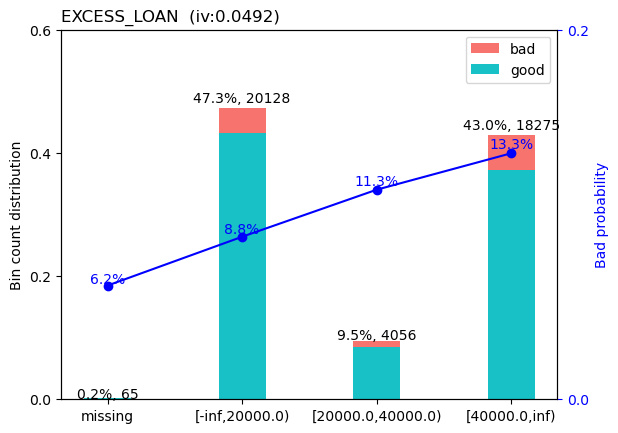

In [247]:
# plot the bins
sc.woebin_plot(bins)

### Split Data

In [51]:
# split data into 70% train and 30% test
train, test = sc.split_df(df_top_11, 'TARGET', ratio=0.7).values()
print(train.shape)
print(test.shape)

(29767, 12)
(12757, 12)


#### WOE Encoding 

In [52]:
# prepare a dataset with the WOE values for Logistic Regression training
# woebin_ply() converts original values of input data into woe
train_woe = sc.woebin_ply(train, bins)
test_woe = sc.woebin_ply(test, bins)

[INFO] converting into woe values ...
[INFO] converting into woe values ...


### Training & Testing 

In [53]:
#create the X, y parts of data for train and test
y_train = train_woe.loc[:,'TARGET']
X_train = train_woe.loc[:,train_woe.columns != 'TARGET']
y_test = test_woe.loc[:,'TARGET']
X_test = test_woe.loc[:,train_woe.columns != 'TARGET']



### Run Logistic Regression 

In [54]:
#create a logistic regression model object
lr = LogisticRegression(solver='newton-cg', class_weight='balanced')
lr.fit(X_train, y_train)
print(lr.coef_)
print(lr.intercept_)

[[0.54847257 0.31179311 0.92698363 0.48324422 0.84796073 0.27231923
  0.68982031 0.35473009 0.16399974 0.66154301 0.77297788]]
[-0.00322715]


### Scorecard Construction 

In [55]:
#generate a card from the model and bins. The scores will be based on probability of default from the model
card = sc.scorecard(bins, lr, X_train.columns, points0 = 600, odds0 = 1/3, pdo = 20,
      basepoints_eq0 = True)

pprint.pprint(card)

{'AMT_INCOME_TOTAL':            variable                  bin  points
3  AMT_INCOME_TOTAL       [-inf,90000.0)   50.00
4  AMT_INCOME_TOTAL   [90000.0,170000.0)   51.00
5  AMT_INCOME_TOTAL  [170000.0,230000.0)   52.00
6  AMT_INCOME_TOTAL       [230000.0,inf)   55.00,
 'Avg_AMT_CREDIT_SUM':               variable                  bin  points
30  Avg_AMT_CREDIT_SUM       [-inf,40000.0)   49.00
31  Avg_AMT_CREDIT_SUM   [40000.0,340000.0)   51.00
32  Avg_AMT_CREDIT_SUM  [340000.0,980000.0)   53.00
33  Avg_AMT_CREDIT_SUM       [980000.0,inf)   58.00,
 'Avg_DAYS_CREDIT':            variable              bin  points
34  Avg_DAYS_CREDIT    [-inf,-900.0)   53.00
35  Avg_DAYS_CREDIT  [-900.0,-650.0)   52.00
36  Avg_DAYS_CREDIT  [-650.0,-350.0)   51.00
37  Avg_DAYS_CREDIT     [-350.0,inf)   50.00,
 'EXCESS_LOAN':        variable                bin  points
16  EXCESS_LOAN            missing   67.00
17  EXCESS_LOAN     [-inf,20000.0)   58.00
18  EXCESS_LOAN  [20000.0,40000.0)   51.00
19  EXCESS_LOAN

#### Train & Test of Scorecard

array([[<Axes: title={'center': 'score'}>]], dtype=object)

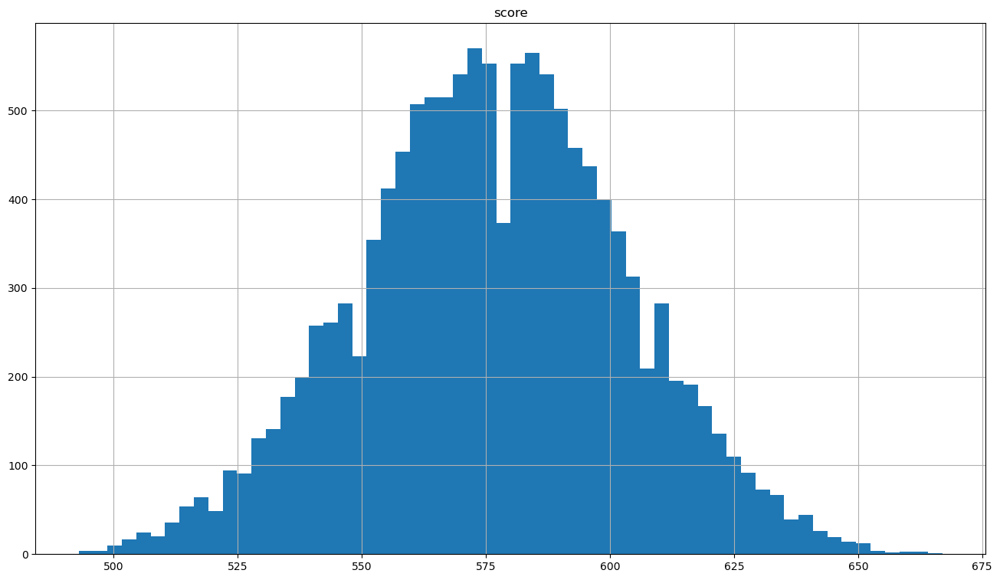

In [56]:
# credit score for samples in test and train
train_score = sc.scorecard_ply(train, card)
test_score = sc.scorecard_ply(test, card)

# plot the distrubution of scores on test data
test_score.hist(figsize=(16,9),bins=60)

In [57]:
# print evaluation metrics of the model
y_pred = lr.predict(X_test)

### Confusion Matrix

In [58]:
print("Confusion matrix:")
print(confusion_matrix(y_pred, y_test))
print("\nPCC measures:")
print(classification_report(y_pred, y_test))


Confusion matrix:
[[7618  420]
 [3739  980]]

PCC measures:
              precision    recall  f1-score   support

           0       0.67      0.95      0.79      8038
           1       0.70      0.21      0.32      4719

    accuracy                           0.67     12757
   macro avg       0.69      0.58      0.55     12757
weighted avg       0.68      0.67      0.61     12757



### ROC AUC

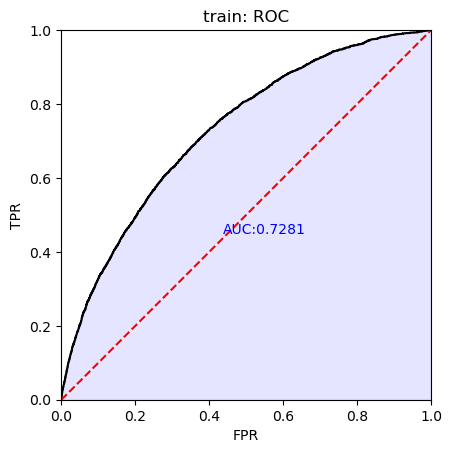

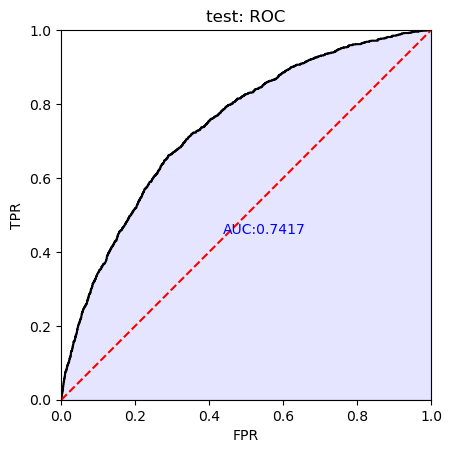

In [256]:
# evaluate the performance of the logistic regression
train_pred = lr.predict_proba(X_train)[:,1]
test_pred = lr.predict_proba(X_test)[:,1]

# performance ks & roc
train_perf = sc.perf_eva(y_train, train_pred, plot_type=['roc'], title = "train")
test_perf = sc.perf_eva(y_test, test_pred, plot_type=['roc'], title = "test")

# Top 15 Variables

In [257]:
# Get the top 8 IVs
top_15_IVs = dict(sorted(top_20_IV.items(), key=lambda item: item[1], reverse=True)[:15])
top_15_IVs

{'EXT_SOURCE_3': 0.2970320905195953,
 'EXT_SOURCE_2': 0.24750941090504391,
 'EXT_SOURCE_1': 0.16145209148368728,
 'NAME_EDUCATION_TYPE': 0.12327113537446847,
 'Avg_DAYS_CREDIT': 0.07372418009489842,
 'OCCUPATION_TYPE': 0.0642512120225725,
 'REGION_RATING_CLIENT_W_CITY': 0.06341713032340965,
 'EXCESS_LOAN': 0.049183259915592845,
 'ORGANIZATION_TYPE': 0.04902437966124821,
 'Avg_AMT_CREDIT_SUM': 0.03283064637630767,
 'AMT_ANNUITY': 0.03257884474467163,
 'SUM_DOCUMENT_FLAGS': 0.029368465212611706,
 'AMT_INCOME_TOTAL': 0.026839369095768072,
 'CREDIT_ACTIVE': 0.025927038577130315,
 'NAME_INCOME_TYPE': 0.025511552028309507}

In [258]:
# Assuming top_15_IVs is a dictionary with the top 15 IV columns
top_15_columns = list(top_15_IVs.keys())

# Filter the DataFrame to keep only the top 8 columns
df_top_15 = target_df[top_15_columns + ['TARGET']]
df_top_15.head()

,EXT_SOURCE_3,EXT_SOURCE_2,EXT_SOURCE_1,NAME_EDUCATION_TYPE,Avg_DAYS_CREDIT,OCCUPATION_TYPE,REGION_RATING_CLIENT_W_CITY,EXCESS_LOAN,ORGANIZATION_TYPE,Avg_AMT_CREDIT_SUM,AMT_ANNUITY,SUM_DOCUMENT_FLAGS,AMT_INCOME_TOTAL,CREDIT_ACTIVE,NAME_INCOME_TYPE,TARGET
0,0.80,0.41,NaN,Higher education,-1344.50,Core staff,2.00,55062.00,Police,1371731.03,21969.00,1.00,171000.00,3,State servant,0
1,0.38,0.56,NaN,Incomplete higher,-959.12,Core staff,2.00,142560.00,Military,894870.00,32143.50,1.00,315000.00,5,Working,0
2,0.15,0.53,0.63,Secondary / secondary special,-1427.43,NaN,2.00,0.00,Industry: type 3,243305.36,35613.00,1.00,150039.00,1,Commercial associate,0
3,0.41,0.54,0.27,Higher education,-1607.11,Laborers,2.00,59400.00,Business Entity Type 3,114134.60,13833.00,1.00,135000.00,3,Working,1
4,0.15,0.26,NaN,Secondary / secondary special,-137.00,Drivers,2.00,44550.00,Business Entity Type 3,22500.00,24853.50,1.00,135000.00,1,Commercial associate,0


#### Bin

In [259]:
bins = sc.woebin(df_top_15, y='TARGET')


[INFO] creating woe binning ...
>>> There are 1 variables have too many unique non-numberic values, which might cause the binning process slow. Please double check the following variables: 
ORGANIZATION_TYPE
>>> Continue the binning process?
1: yes 
2: no


{'EXT_SOURCE_2': <Figure size 640x480 with 2 Axes>,
 'Avg_DAYS_CREDIT': <Figure size 640x480 with 2 Axes>,
 'Avg_AMT_CREDIT_SUM': <Figure size 640x480 with 2 Axes>,
 'NAME_EDUCATION_TYPE': <Figure size 640x480 with 2 Axes>,
 'OCCUPATION_TYPE': <Figure size 640x480 with 2 Axes>,
 'ORGANIZATION_TYPE': <Figure size 640x480 with 2 Axes>,
 'NAME_INCOME_TYPE': <Figure size 640x480 with 2 Axes>,
 'EXT_SOURCE_3': <Figure size 640x480 with 2 Axes>,
 'REGION_RATING_CLIENT_W_CITY': <Figure size 640x480 with 2 Axes>,
 'CREDIT_ACTIVE': <Figure size 640x480 with 2 Axes>,
 'AMT_INCOME_TOTAL': <Figure size 640x480 with 2 Axes>,
 'SUM_DOCUMENT_FLAGS': <Figure size 640x480 with 2 Axes>,
 'AMT_ANNUITY': <Figure size 640x480 with 2 Axes>,
 'EXT_SOURCE_1': <Figure size 640x480 with 2 Axes>,
 'EXCESS_LOAN': <Figure size 640x480 with 2 Axes>}

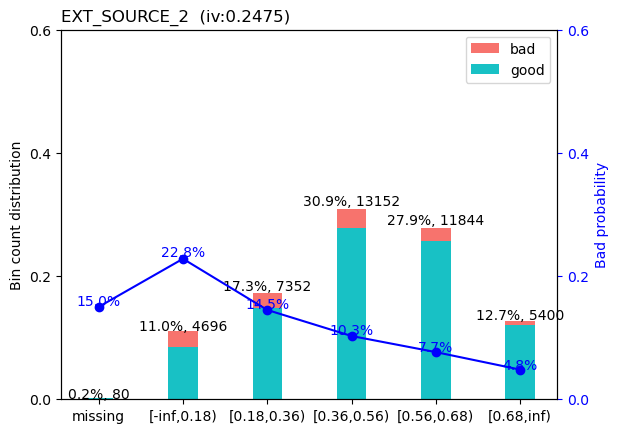

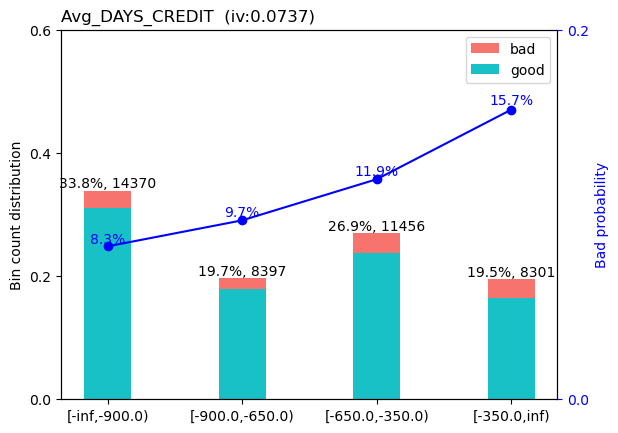

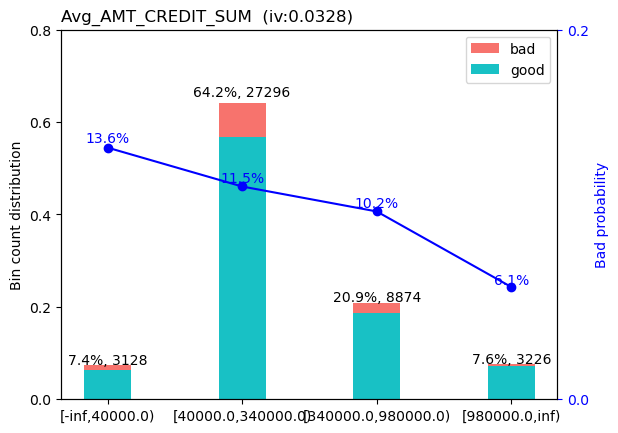

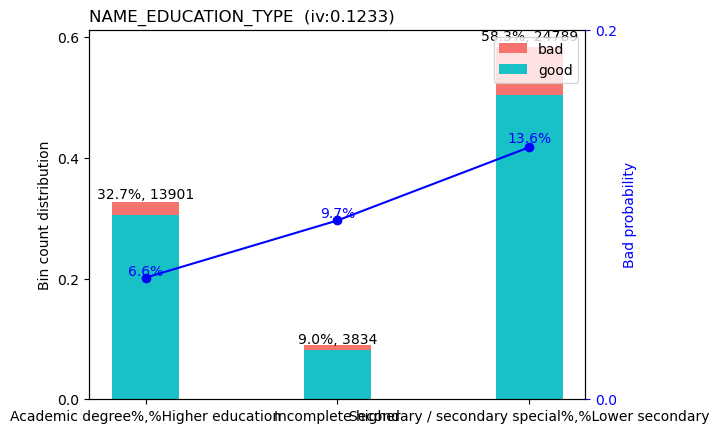

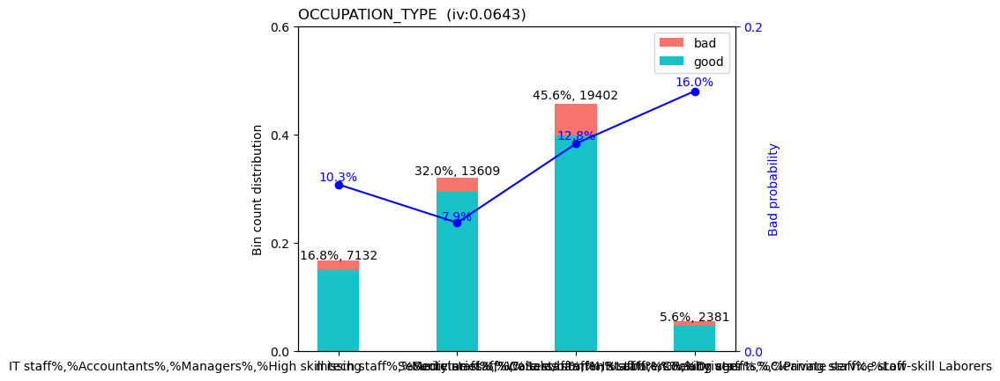

...

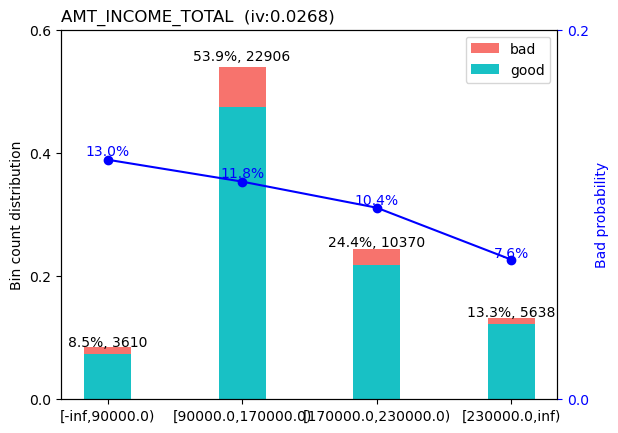

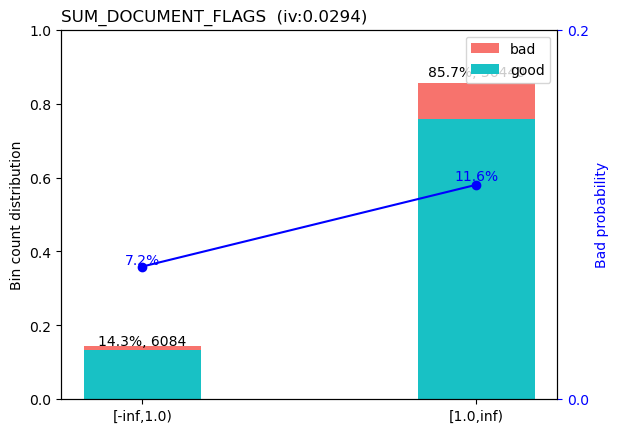

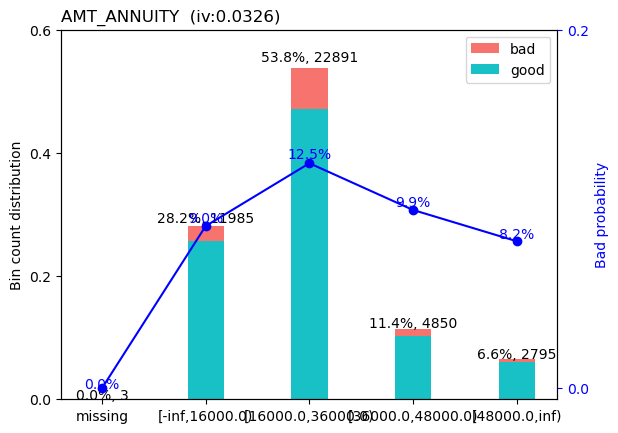

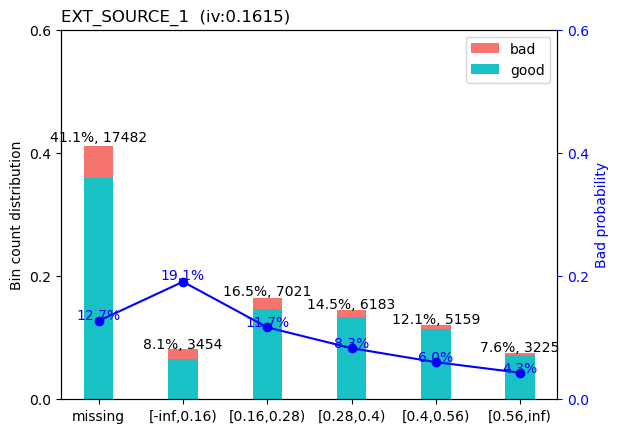

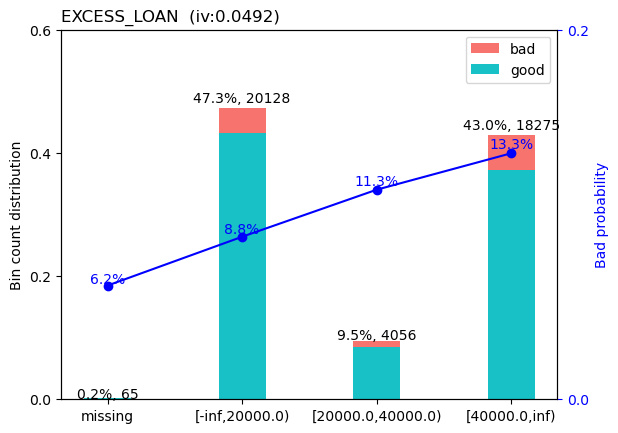

In [260]:
# plot the bins
sc.woebin_plot(bins)

### Split Data

In [261]:
# split data into 70% train and 30% test
train, test = sc.split_df(df_top_15, 'TARGET', ratio=0.7).values()
print(train.shape)
print(test.shape)

(29767, 16)
(12757, 16)


#### WOE Encoding 

In [262]:
# prepare a dataset with the WOE values for Logistic Regression training
# woebin_ply() converts original values of input data into woe
train_woe = sc.woebin_ply(train, bins)
test_woe = sc.woebin_ply(test, bins)

[INFO] converting into woe values ...


[INFO] converting into woe values ...


### Training & Testing 

In [263]:
#create the X, y parts of data for train and test
y_train = train_woe.loc[:,'TARGET']
X_train = train_woe.loc[:,train_woe.columns != 'TARGET']
y_test = test_woe.loc[:,'TARGET']
X_test = test_woe.loc[:,train_woe.columns != 'TARGET']



### Run Logistic Regression 

In [264]:
#create a logistic regression model object
lr = LogisticRegression(solver='newton-cg', class_weight='balanced')
lr.fit(X_train, y_train)
print(lr.coef_)
print(lr.intercept_)

[[0.26238647 0.77714988 0.17545565 0.85829579 0.50104745 0.6965131
  0.22269637 0.2641627  0.34037641 0.39512555 0.54060963 0.46452498
  0.66615131 0.47644297 0.69653448]]
[-0.00336704]


### Scorecard Construction 

In [265]:
#generate a card from the model and bins. The scores will be based on probability of default from the model
card = sc.scorecard(bins, lr, X_train.columns, points0 = 600, odds0 = 1/3, pdo = 20,
      basepoints_eq0 = True)

pprint.pprint(card)

{'AMT_ANNUITY':        variable                bin  points
47  AMT_ANNUITY            missing   26.00
48  AMT_ANNUITY     [-inf,16000.0)   41.00
49  AMT_ANNUITY  [16000.0,36000.0)   36.00
50  AMT_ANNUITY  [36000.0,48000.0)   39.00
51  AMT_ANNUITY      [48000.0,inf)   42.00,
 'AMT_INCOME_TOTAL':             variable                  bin  points
41  AMT_INCOME_TOTAL       [-inf,90000.0)   36.00
42  AMT_INCOME_TOTAL   [90000.0,170000.0)   37.00
43  AMT_INCOME_TOTAL  [170000.0,230000.0)   39.00
44  AMT_INCOME_TOTAL       [230000.0,inf)   42.00,
 'Avg_AMT_CREDIT_SUM':               variable                  bin  points
10  Avg_AMT_CREDIT_SUM       [-inf,40000.0)   35.00
11  Avg_AMT_CREDIT_SUM   [40000.0,340000.0)   37.00
12  Avg_AMT_CREDIT_SUM  [340000.0,980000.0)   39.00
13  Avg_AMT_CREDIT_SUM       [980000.0,inf)   45.00,
 'Avg_DAYS_CREDIT':           variable              bin  points
6  Avg_DAYS_CREDIT    [-inf,-900.0)   40.00
7  Avg_DAYS_CREDIT  [-900.0,-650.0)   39.00
8  Avg_DAYS_CREDI

#### Train & Test of Scorecard

array([[<Axes: title={'center': 'score'}>]], dtype=object)

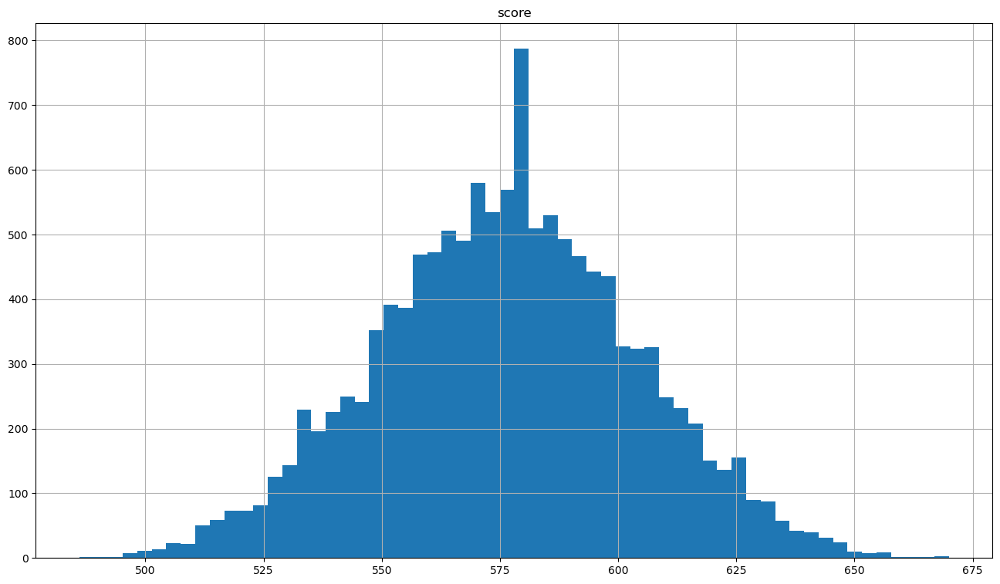

In [266]:
# credit score for samples in test and train
train_score = sc.scorecard_ply(train, card)
test_score = sc.scorecard_ply(test, card)

# plot the distrubution of scores on test data
test_score.hist(figsize=(16,9),bins=60)

In [267]:
# print evaluation metrics of the model
y_pred = lr.predict(X_test)

### Confusion Matrix

In [268]:
print("Confusion matrix:")
print(confusion_matrix(y_pred, y_test))
print("\nPCC measures:")
print(classification_report(y_pred, y_test))


Confusion matrix:
[[7659  414]
 [3698  986]]

PCC measures:
              precision    recall  f1-score   support

           0       0.67      0.95      0.79      8073
           1       0.70      0.21      0.32      4684

    accuracy                           0.68     12757
   macro avg       0.69      0.58      0.56     12757
weighted avg       0.69      0.68      0.62     12757



### ROC AUC

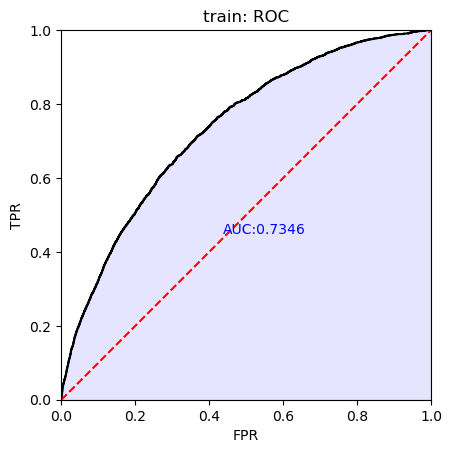

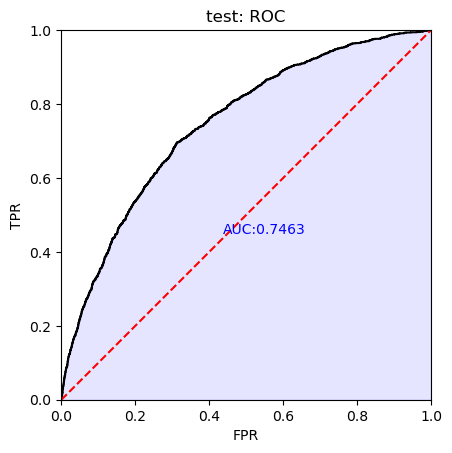

In [269]:
# evaluate the performance of the logistic regression
train_pred = lr.predict_proba(X_train)[:,1]
test_pred = lr.predict_proba(X_test)[:,1]

# performance ks & roc
train_perf = sc.perf_eva(y_train, train_pred, plot_type=['roc'], title = "train")
test_perf = sc.perf_eva(y_test, test_pred, plot_type=['roc'], title = "test")

## MANUAL BINNING for AMT_ANNUITY

[INFO] creating woe binning ...
>>> There are 1 variables have too many unique non-numberic values, which might cause the binning process slow. Please double check the following variables: 
ORGANIZATION_TYPE
>>> Continue the binning process?
1: yes 
2: no


{'AMT_ANNUITY': <Figure size 640x480 with 2 Axes>}

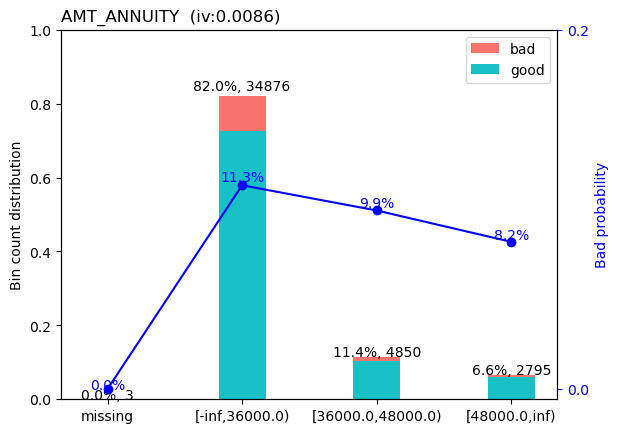

In [270]:
# bin adjustments for AMT_GOODS_PRICE - reduce to 4 bins to make monotonic
breaks_adj = {'AMT_ANNUITY' : [36000,48000]}
bins2 = sc.woebin(df_top_15, y='TARGET',breaks_list=breaks_adj)
sc.woebin_plot(bins2['AMT_ANNUITY'])

## TEST if manual binning improves the results

In [271]:
# split data into 70% train and 30% test
train, test = sc.split_df(df_top_15, 'TARGET', ratio=0.7).values()
print(train.shape)
print(test.shape)

(29767, 16)
(12757, 16)


#### WOE Encoding 

In [272]:
# prepare a dataset with the WOE values for Logistic Regression training
# woebin_ply() converts original values of input data into woe
train_woe = sc.woebin_ply(train, bins2)
test_woe = sc.woebin_ply(test, bins2)

[INFO] converting into woe values ...


[INFO] converting into woe values ...


### Training & Testing 

In [273]:
#create the X, y parts of data for train and test
y_train = train_woe.loc[:,'TARGET']
X_train = train_woe.loc[:,train_woe.columns != 'TARGET']
y_test = test_woe.loc[:,'TARGET']
X_test = test_woe.loc[:,train_woe.columns != 'TARGET']



### Run Logistic Regression 

In [274]:
#create a logistic regression model object
lr = LogisticRegression(solver='newton-cg', class_weight='balanced')
lr.fit(X_train, y_train)
print(lr.coef_)
print(lr.intercept_)

[[ 0.2667174   0.77551967  0.17176749  0.86035439  0.50630984  0.69610138
   0.22511656  0.41055471  0.38127963  0.39620519  0.55408885 -0.02538729
   0.66789237  0.47712816  0.74309517]]
[-0.0034189]


### Scorecard Construction 

In [275]:
#generate a card from the model and bins. The scores will be based on probability of default from the model
card = sc.scorecard(bins2, lr, X_train.columns, points0 = 600, odds0 = 1/3, pdo = 20,
      basepoints_eq0 = True)

pprint.pprint(card)

{'AMT_ANNUITY':        variable                bin  points
47  AMT_ANNUITY            missing   39.00
48  AMT_ANNUITY     [-inf,36000.0)   38.00
49  AMT_ANNUITY  [36000.0,48000.0)   38.00
50  AMT_ANNUITY      [48000.0,inf)   38.00,
 'AMT_INCOME_TOTAL':             variable                  bin  points
41  AMT_INCOME_TOTAL       [-inf,90000.0)   36.00
42  AMT_INCOME_TOTAL   [90000.0,170000.0)   37.00
43  AMT_INCOME_TOTAL  [170000.0,230000.0)   39.00
44  AMT_INCOME_TOTAL       [230000.0,inf)   42.00,
 'Avg_AMT_CREDIT_SUM':               variable                  bin  points
10  Avg_AMT_CREDIT_SUM       [-inf,40000.0)   35.00
11  Avg_AMT_CREDIT_SUM   [40000.0,340000.0)   37.00
12  Avg_AMT_CREDIT_SUM  [340000.0,980000.0)   39.00
13  Avg_AMT_CREDIT_SUM       [980000.0,inf)   45.00,
 'Avg_DAYS_CREDIT':           variable              bin  points
6  Avg_DAYS_CREDIT    [-inf,-900.0)   40.00
7  Avg_DAYS_CREDIT  [-900.0,-650.0)   39.00
8  Avg_DAYS_CREDIT  [-650.0,-350.0)   37.00
9  Avg_DAYS_CRED

#### Train & Test of Scorecard

array([[<Axes: title={'center': 'score'}>]], dtype=object)

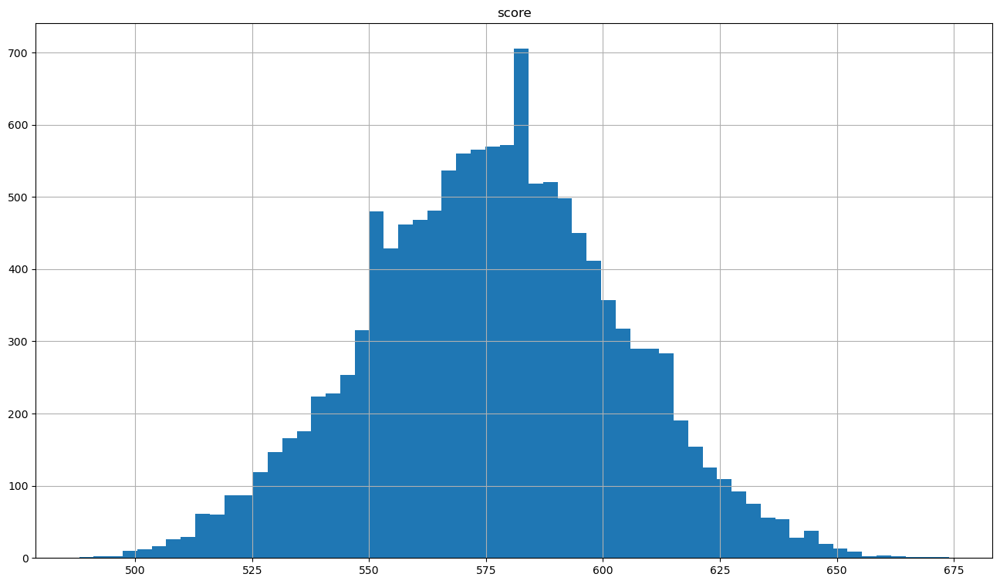

In [276]:
# credit score for samples in test and train
train_score = sc.scorecard_ply(train, card)
test_score = sc.scorecard_ply(test, card)

# plot the distrubution of scores on test data
test_score.hist(figsize=(16,9),bins=60)

In [277]:
# print evaluation metrics of the model
y_pred = lr.predict(X_test)

### Confusion Matrix

In [278]:
print("Confusion matrix:")
print(confusion_matrix(y_pred, y_test))
print("\nPCC measures:")
print(classification_report(y_pred, y_test))


Confusion matrix:
[[7653  422]
 [3704  978]]

PCC measures:
              precision    recall  f1-score   support

           0       0.67      0.95      0.79      8075
           1       0.70      0.21      0.32      4682

    accuracy                           0.68     12757
   macro avg       0.69      0.58      0.55     12757
weighted avg       0.68      0.68      0.62     12757



### ROC AUC

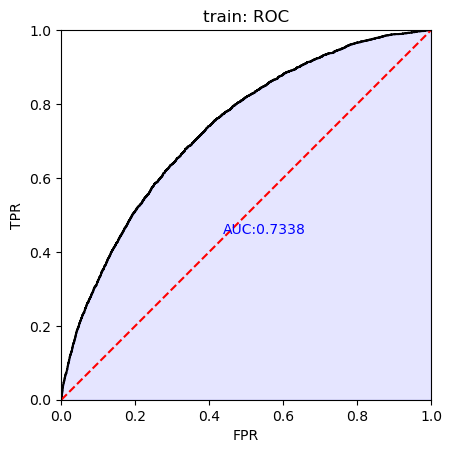

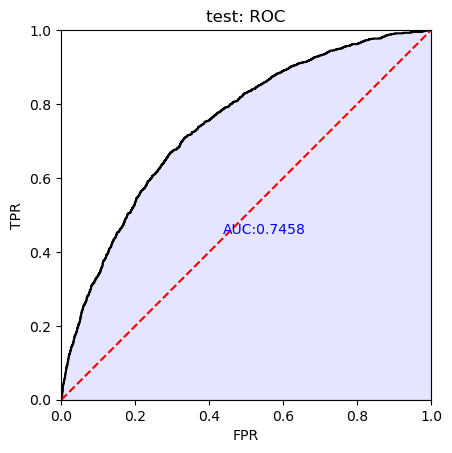

In [279]:
# evaluate the performance of the logistic regression
train_pred = lr.predict_proba(X_train)[:,1]
test_pred = lr.predict_proba(X_test)[:,1]

# performance ks & roc
train_perf = sc.perf_eva(y_train, train_pred, plot_type=['roc'], title = "train")
test_perf = sc.perf_eva(y_test, test_pred, plot_type=['roc'], title = "test")

#### Since Confusion Matrix is same after manual binning, but AUC is lower than before, the final score card would be the 15 variable scorecard without manual binning